# Introduction

Being able to classify images of cancerous cells accurately benefits both the medical professionals and the patients whose health is in question. This project aims to accurately and precisely classify matastatic cancer from small images taken from larger scans of dyed tissue samples. 

The dataset used is from a Kaggle competition, "Histopathologic Cancer Detection" [1]. The dataset contains about 220,000 training images of size 96x96 pixels, with 3 channels (RGB). The images are labeled as either cancerous or non-cancerous, with a split of about 40% cancerous and 60% non-cancerous images. In addition to the training dataset, there is a test dataset of about 57,500 images. 

This project will label the test dataaset using a Convolutional Neural Network (CNN) and classification architecture trained on at least a subset of the preprocessed training dataset. The labels will be submitted to Kaggle for evaluation against the ground truth labels. 

I will create an initial baseline model of standard CNN architecture, trained on the original color images. I will then test the architecture against grayscale images, as I will be able to train on a larger dataset with grayscale images. I will then experiment with various hyperparameters to determine a better architecture and/or optimizer for the task.

The final inferences on test dataset will be submitted to Kaggle for accuracy evaluation.

# Table of Contents

- Introduction
- Table of Contents
- Configuration and Imports
- Helper Functions
- Exploratory Data Analysis (EDA)
    - Label Distribution
    - Sample Diverse Images
- Model Definition and Training
    - Baseline Color Model
        - Train the Color Model
        - Visualize the Model Filters and Feature Maps
        - Visualize the Grad-CAM Heat Maps
    - Baseline Grayscale Model
        - Visualize the Grad-CAM Heat Maps
    - Hyperparameter Tuning and Architecture Exploration
        - Increase the Kernel Size
        - Add Convolutional Layers
        - Remove Convolutional Layers
        - Remove Dense Layers
        - Dropout Rate Adjustment
- Final Model Predictions
    - Grayscale Model with Entire Dataset
- Conclusion and Results Summary
- References


# Configuration and Imports

Below are the configurations to setup the environment to enable training on the GPU, along with setting the constants and paths for the project

In [1]:

import os
import gc

os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true" 
os.environ["LD_LIBRARY_PATH"] = (
    "/usr/local/cuda/lib64:/usr/lib/x86_64-linux-gnu:"
    + os.environ.get("LD_LIBRARY_PATH", "")
)
import tensorflow as tf
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)
        
tf.keras.backend.clear_session()
gc.collect()
import keras as k

print(k.__version__)

print(tf.config.list_physical_devices("GPU"))
print(tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices("GPU")))
print(tf.config.list_physical_devices("GPU"))

2025-08-17 17:53:45.282623: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-17 17:53:45.651456: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-08-17 17:53:45.651571: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-08-17 17:53:45.713194: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-08-17 17:53:45.836201: I tensorflow/core/platform/cpu_feature_guar

2.15.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
2.15.0
Num GPUs Available:  1
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2025-08-17 17:53:49.351145: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-17 17:53:49.565115: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-17 17:53:49.565169: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


In [ ]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "1"  # Show important logs
os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Force use of GPU 0

# Check for GPU and enable memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("GPU is available and memory growth is enabled.")
    except RuntimeError as e:
        print("RuntimeError during GPU setup:", e)
else:
    print("No GPU detected. Check your driver and CUDA installation.")


✅ GPU is available and memory growth is enabled.


In [3]:
# Import libraries and dataset
import cv2
import gc
from io import StringIO
import itertools
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pickle
import psutil
import sys
from tf_explain.core.grad_cam import GradCAM

# For 2d convolutional neural networks with keras
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from keras.models import Sequential
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.datasets import mnist
from keras.models import Sequential, load_model
from keras.utils import to_categorical
from keras import mixed_precision


mixed_precision.set_global_policy("float32")

from sklearn.model_selection import train_test_split

DATA_LOAD = "CANCER"  # Change to "CANCER" to load cancer dataset
SAMPLE_SIZE = 20000  # Number of samples to use for training and testing

ROOT_DIR = os.getcwd()
DATA_DIR = ROOT_DIR + "/data/"
MODEL_DIR = ROOT_DIR + "/models/"
SUB_DIR = DATA_DIR + "/submissions/"

TRAIN_DIR = DATA_DIR + "train/"
TEST_DIR = DATA_DIR + "test/"
train_image_files = [f for f in os.listdir(TRAIN_DIR) if f.endswith(".tif")]
test_image_files = [f for f in os.listdir(TEST_DIR) if f.endswith(".tif")]
y_df = pd.read_csv(DATA_DIR + "train_labels.csv", index_col=0, header=0)

WIDTH = 28
HEIGHT = 28
CHANNELS = 1  # Grayscale images

Cancer_examples = [
    "8eabc80fce3a231915b93651f5e9238447d3db62.tif",
    "efc515748e4faac32ed2b703c6ed4961330a0c8f.tif",
    "9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif",
    "8918830b9466236be012c57ead765be063a0005b.tif"
]
Benign_examples = [
    "8549665b7d0a808ab920e9dbed44bcf996d3019a.tif",
    "d450b11347e15d53490206b7d8dc44207b0e5326.tif",
    "6db1b2e1fed0431041c02337dd25575787d08acf.tif",
    "39f2e52674cf710d6a3616ac34b62d161bff143d.tif",
    "d28c568002156f378a54ba13504b5fa5d2505754.tif",
]

files_examples = Cancer_examples + Benign_examples


# HELPER FUNCTIONS

The functions below are used to handle the importation of the data at the various stages in the training and hyperparameter tuning process. Along with functions that make naming conventions easier to follow to enable model comparison.

In [ ]:
def convert_to_grayscale(image):
    """
    Convert a color image to grayscale.
    """
    if len(image.shape) == 3 and image.shape[2] == 3:
        if image.dtype == np.float16:
            image = image.astype(np.float32)
        return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return None


def get_model_name(model, optimizer_name="adam"):
    """
    Generate a descriptive name for the model based on its architecture and parameters.
    """
    input_shape = model.input_shape[1:]  # e.g., (96, 96, 3)
    input_str = "x".join(map(str, input_shape))

    conv_filters = []
    dense_units = []
    activation = None
    total_params = model.count_params() // 1000  # in thousands

    for layer in model.layers:
        class_name = layer.__class__.__name__
        if "Conv2D" in class_name:
            conv_filters.append(layer.filters)
        elif "Dense" in class_name:
            dense_units.append(layer.units)
            if activation is None:
                activation = layer.activation.__name__

    conv_str = "C" + "-".join(map(str, conv_filters)) if conv_filters else ""
    # Get Global Average Pooling or Flatten
    if "GlobalAveragePooling2D" in model.layers[-4].__class__.__name__:
        dense_units.append("GAP")
    elif "Flatten" in model.layers[-4].__class__.__name__:
        dense_units.append("FLAT")
    # Dense layers
    dense_str = "FC" + "-".join(map(str, dense_units)) if dense_units else ""

    name_parts = [
        "CNN",
        input_str,
        conv_str,
        dense_str,
        activation,
        f"{total_params}K",
        optimizer_name,
    ]

    return "_".join(part for part in name_parts if part)


def get_memory_mb():
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / (1024**2)  # Resident Set Size in MB


def load_train_images(
    image_files,
    image_dir,
    labels_df=None,  # y_train_df if available, otherwise None for test set
    target_size=(96, 96),
    start_index=0,
    batch_size=20000,
    gray_scale=False,
    dtype=np.float16,  # np.float32 or np.float16
):
    """
    Returns (X, y) where:
      X: (N, H, W, 3) float16 in [0,1]
      y: (N,) int8
    Skips unreadable images; resizes everything to target_size.s
    """
    end_index = min(start_index + batch_size, len(image_files))
    slice_files = image_files[start_index:end_index]
    print(f"Loading {len(slice_files)} images from {image_dir}...")

    X_images = []
    y_labels = []
    start_memory = get_memory_mb()
    H, W = target_size
    count = 0
    for fname in slice_files:
        count += 1
        if count % 10000 == 0:
            current_memory = get_memory_mb()
            percent_completed = count / len(slice_files)
            expected_memory = (
                (current_memory - start_memory) / percent_completed
                if percent_completed > 0
                else 0
            )
            print(f"Processed {count} images out of {len(slice_files)}...")
            print(f"Current memory usage: {current_memory:.2f} MB")
            print(f"Percent Completed: {100 * count / len(slice_files):.2f}%")
            print(f"Expected memory usage: {expected_memory:.2f} MB")

        if not fname.endswith(".tif"):
            continue
        path = os.path.join(image_dir, fname)
        img = cv2.imread(path, cv2.IMREAD_COLOR)  # BGR
        if img is None:
            continue
        # # resize if needed
        # if img.shape[:2] != (H, W):
        #     img = cv2.resize(img, (W, H), interpolation=cv2.INTER_AREA)
        # BGR->RGB (optional; only if your training assumed RGB)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # normalize
        img = img.astype(dtype) / 255.0

        if gray_scale:
            img = convert_to_grayscale(img)
            # if img is None:
            #     continue

        X_images.append(img)

        if labels_df is not None:
            # remove ".tif"
            key = os.path.splitext(fname)[0]
            try:
                y_labels.append(int(labels_df.loc[key, "label"]))
            except KeyError:
                print(f"Warning: No label found for {key}. Skipping.")
                # X_images.pop()  # remove last image
                continue

    if not X_images:
        return np.empty((0, H, W, 3), dtype=dtype), np.empty((0,), dtype=np.int8)

    X = np.stack(X_images).astype(dtype, copy=False)
    y = np.asarray(y_labels, dtype=np.int8)

    # help GC (drop lists)
    del X_images, y_labels
    gc.collect()
    return X, y


def plot_history(history, metric="accuracy"):
    """
    Plot training and validation metrics over epochs.
    """
    plt.figure(figsize=(12, 6))
    plt.plot(history.history[metric], label=f"Train {metric}", color="blue")
    plt.plot(history.history[f"val_{metric}"], label=f"Val {metric}", color="orange")
    plt.title(f"Model {metric} over epochs")
    plt.xlabel("Epochs")
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid()
    plt.show()


def load_model_and_history(model_name, model_dir=MODEL_DIR):
    """
    Load a Keras model and its training history from disk.
    """
    model_path = os.path.join(model_dir, f"{model_name}.h5")
    history_path = os.path.join(model_dir, f"{model_name}_history.pkl")

    if not os.path.exists(model_path):
        raise FileNotFoundError(f"Model file {model_path} does not exist.")

    model = load_model(model_path)

    if not os.path.exists(history_path):
        raise FileNotFoundError(f"History file {history_path} does not exist.")

    with open(history_path, "rb") as f:
        history = pickle.load(f)

    return model, history


def save_model_and_history(model, history, model_name, model_dir=MODEL_DIR):
    """
    Save a Keras model and its training history to disk.
    """
    model_path = os.path.join(model_dir, f"{model_name}.h5")
    if history:
        history_path = os.path.join(model_dir, f"{model_name}_history.pkl")
        with open(history_path, "wb") as f:
            pickle.dump(history.history, f)
    model_performance_path = os.path.join(model_dir, f"{model_name}_performance.txt")

    model.save(model_path)

    # Capture model summary
    summary_buffer = StringIO()
    model.summary(print_fn=lambda x: summary_buffer.write(x + "\n"))
    model_summary_str = summary_buffer.getvalue()
    summary_buffer.close()

    with open(model_performance_path, "w") as f:
        f.write(f"Model Name: {model_name}\n")
        f.write(f"Input Shape: {model.input_shape[1:]}\n")
        f.write(f"Total Parameters: {model.count_params() // 1000}K\n")
        f.write(f"Optimizer: Adam\n")
        f.write(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
        f.write(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
        f.write("Model Summary:\n")
        f.write(model_summary_str)

    print(f"Model and history saved as {model_name}.")


def get_test_predictions(
    model,
    test_image_files,
    test_dir=TEST_DIR,
    target_size=(96, 96),
    batch_size=512,
    gray_scale=False,
    dtype=np.float16,
):
    """
    Get predictions for the test set using the trained model.
    Processes test images in batches to avoid OOM.
    """
    all_preds = []
    all_ids = []
    n = len(test_image_files)
    for start in range(0, n, batch_size):
        end = min(start + batch_size, n)
        batch_files = test_image_files[start:end]
        X_test, _ = load_train_images(
            batch_files,
            test_dir,
            target_size=target_size,
            batch_size=len(batch_files),
            gray_scale=gray_scale,
            dtype=dtype,
        )
        if gray_scale:
            X_test = np.expand_dims(X_test, axis=-1)
        preds = model.predict(X_test, batch_size=min(64, len(batch_files))).flatten()
        all_preds.append(preds)
        all_ids.extend([os.path.splitext(f)[0] for f in batch_files])
    preds = np.concatenate(all_preds)
    labels = (preds >= 0.5).astype(int)
    df = pd.DataFrame({"id": all_ids, "label": labels})
    return df


def gradcam_visualize(
    model, img, layer_name=None, overlay_alpha=0.40, contrast_stretch=True, show=True
):
    """
    Works with BOTH RGB models (input C=3) and gray models (input C=1).
    Returns (heatmap_rgb, overlay_rgb) at input resolution.
    """

    in_ch = model.input_shape[-1]  # 1 or 3

    # Correct Tesnor dimensions (1,H,W,C) float32 
    x = np.asarray(img)

    # If x has no channel dim
    if x.ndim == 2:  # (H,W)
        if in_ch == 1:
            x = x[..., np.newaxis]  # (H,W,1)
        else:
            x = np.stack([x, x, x], axis=-1)  # (H,W,3)
    elif x.ndim == 3:
        if x.shape[-1] == 1 and in_ch == 3:  # (H,W,1) -> (H,W,3)
            x = np.repeat(x, 3, axis=-1)
        elif x.shape[-1] == 3 and in_ch == 1:  # (H,W,3) -> (H,W,1)
            x = cv2.cvtColor(x.astype(np.float32), cv2.COLOR_RGB2GRAY)[..., np.newaxis]
    elif x.ndim == 4:
        # (1,H,W,C) – ensure channels match
        if x.shape[-1] != in_ch:
            if x.shape[-1] == 1 and in_ch == 3:
                x = np.repeat(x, 3, axis=-1)
            elif x.shape[-1] == 3 and in_ch == 1:
                x = cv2.cvtColor(x[0].astype(np.float32), cv2.COLOR_RGB2GRAY)[
                    ..., np.newaxis
                ][np.newaxis, ...]
    else:
        raise ValueError(f"Unexpected image shape: {x.shape}")

    if x.ndim == 3:
        x = x[np.newaxis, ...]  # (1,H,W,C)

    x = x.astype(np.float32)
    if x.max() > 1.0:  # normalize if given as 0..255
        x = x / 255.0

    # Get last conv layer as required for visualizing gradients
    if layer_name is None:
        conv_layers = [
            l.name for l in model.layers if isinstance(l, tf.keras.layers.Conv2D)
        ]
        if not conv_layers:
            raise ValueError("No Conv2D layers found in the model.")
        layer_name = conv_layers[-1]

    # Build logits view to avoid entirely purple image
    logits = tf.keras.layers.Lambda(
        lambda z: tf.math.log(z / (1.0 - z + 1e-7) + 1e-7), name="logit"
    )(model.output)
    logit_model = tf.keras.Model(inputs=model.input, outputs=logits)

    # heatmap only
    explainer = GradCAM()
    explanation = explainer.explain(
        validation_data=(x, np.array([0], dtype=np.int32)),  # label unused
        model=logit_model,
        class_index=0,  # scalar output
        layer_name=layer_name,
        image_weight=0.0,
    )

    # Normalize
    heat_rgb = explanation.astype(np.float32)
    if heat_rgb.max() > 1.0:
        heat_rgb /= 255.0

    heat_gray = (
        cv2.cvtColor((heat_rgb * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY).astype(
            np.float32
        )
        / 255.0
    )
    if contrast_stretch:
        lo, hi = np.percentile(heat_gray, [5, 95])
        heat_gray = np.clip((heat_gray - lo) / (hi - lo + 1e-8), 0, 1)

    # recolorize for overlay
    heat_color = cv2.applyColorMap((heat_gray * 255).astype(np.uint8), cv2.COLORMAP_JET)
    heat_color = cv2.cvtColor(heat_color, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    # Overlay
    base = x[0]  # (H,W,C) C=1 or 3
    if in_ch == 1:
        base_rgb = np.repeat(base, 3, axis=-1)  # (H,W,3) for overlay
    else:
        base_rgb = base

    overlay = np.clip(
        (1 - overlay_alpha) * base_rgb + overlay_alpha * heat_color, 0.0, 1.0
    )

    # Legend
    if show:
        plt.figure(figsize=(11, 4))

        plt.subplot(1, 3, 1)
        if in_ch == 1:
            plt.imshow(base[..., 0], cmap="gray")
        else:
            plt.imshow(base)
        plt.title("Input")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        im = plt.imshow(heat_gray, cmap="jet", vmin=0, vmax=1)
        plt.title(f"Grad-CAM (layer: {layer_name})")
        plt.axis("off")
        cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
        cbar.set_label("Influence toward target class\nRed = most, Blue = least")

        plt.subplot(1, 3, 3)
        plt.imshow(overlay)
        plt.title("Overlay")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    return heat_rgb, overlay


def plot_heat_maps(
    model,
    x_train_norm_gray, # Normalized grayscale images (N, H, W, 1)
    y_train, # Labels (N,)
    train_image_files, # List of image file names (N,)
    file_indices, # Indices of images to plot heat maps for (list of ints, e.g., [0, 1, 2] or range(len(train_image_files))
):
    for i in range(len(file_indices)):
        INDEX = i
        print(f"Processing image at index: {file_indices[INDEX]}")
        print(f"Image Name: {train_image_files[file_indices[INDEX]]}")

        # Get the image and predict class
        img = x_train_norm_gray[file_indices[INDEX]]
        predict_class = model.predict(np.expand_dims(img, axis=0))
        predicted_prob = predict_class[0][0]
        predict_class = (predict_class >= 0.5).astype(int)[0][0]

        print(f"Actual Class: {y_train[file_indices[0]]}")
        print(f"Predicted Class: {predict_class}")
        print(f"Predicted Probability: {predicted_prob:.4f}")
        heatmap_rgb, overlay_rgb = gradcam_visualize(
            model,
            img,
            layer_name=None,  # auto-pick last Conv2D
            overlay_alpha=0.40,  # heatmap opacity on top of image
            contrast_stretch=True,  # percentile stretch for visibility
            show=True,
        )

In [10]:
# Tests for functions to ensure working as intended
test_examples = files_examples
X, y = load_train_images(
    test_examples,
    (DATA_DIR + "train/").replace("//", "/"),
    labels_df=y_df,  # y_train_df if available, otherwise None for test set
    target_size=(96, 96),
    start_index=0,
    batch_size=5,
    gray_scale=False,
    dtype=np.float16,  # np.float32 or np.float16
)
assert X.shape == (5, 96, 96, 3), f"Expected shape (5, 96, 96, 3), got {X.shape}"
assert y.shape == (5,), f"Expected shape (5,), got {y.shape}"
print("Test passed: load_train_images function works correctly.")

X, y = load_train_images(
    test_examples,
    (DATA_DIR + "train/").replace("//", "/"),
    labels_df=y_df,  # y_train_df if available, otherwise None for test set
    target_size=(96, 96),
    start_index=0,
    batch_size=5,
    gray_scale=True,
    dtype=np.float16,  # np.float32 or np.float16
)
assert X.shape == (5, 96, 96), f"Expected shape (5, 96, 96), got {X.shape}"
assert y.shape == (5,), f"Expected shape (5,), got {y.shape}"
print("Test passed: load_train_images function with grayscale works correctly.")

Loading 5 images from /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Week 3/data/train/...
Test passed: load_train_images function works correctly.
Loading 5 images from /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Week 3/data/train/...
Test passed: load_train_images function with grayscale works correctly.


In [11]:
# Loading the dataset
y_train_df = pd.read_csv(DATA_DIR + "train_labels.csv", index_col=0, header=0)

TRAIN_DIR = DATA_DIR + "train/"
TEST_DIR = DATA_DIR + "test/"

train_length = (
    len(train_image_files) if len(train_image_files) < SAMPLE_SIZE else SAMPLE_SIZE
)
test_length = (
    len(test_image_files)
    if len(test_image_files) < SAMPLE_SIZE * 0.2
    else int(SAMPLE_SIZE * 0.2)
)

x_train_norm = np.empty((train_length, 96, 96, 3), dtype="float16")
x_train_norm_gray = np.empty((train_length, 96, 96), dtype="float16")
y_train = np.empty(len(train_image_files), dtype="int8")
x_test_norm = np.empty((test_length, 96, 96, 3), dtype="float16")
x_test_norm_gray = np.empty((test_length, 96, 96), dtype="float16")
y_test = np.empty(len(test_image_files), dtype="int8")

# Load train dataset

for i, filename in enumerate(train_image_files):
    if i >= train_length:
        y_train = y_train[:i]  # Trim y_train to the correct length
        break
    if filename.endswith(".tif"):
        image = cv2.imread(os.path.join(TRAIN_DIR, filename))

        if image is None:
            print(f"Error loading image {filename}")
            continue
        if image is not None:
            assert image.shape == (
                96,
                96,
                3,
            ), f"Image {filename} has unexpected shape {image.shape}"
            # Normalize the image
            image_norm = image.astype("float16") / 255.0
            assert isinstance(
                image_norm[0, 0, 0], np.float16
            ), f"Image normalization failed for {filename}"
            x_train_norm[i] = image_norm
            x_train_norm_gray[i] = convert_to_grayscale(image_norm)
            # Extract label from filename
            label = y_train_df.loc[filename[:-4], "label"]  # Remove .tif extension
            y_train[i] = label

# load test dataset
for i, filename in enumerate(test_image_files):
    if i >= test_length:
        break
    if filename.endswith(".tif"):
        image = cv2.imread(os.path.join(TEST_DIR, filename))
        if image is None:
            print(f"Error loading image {filename}")
            continue
        if image is not None:
            assert image.shape == (
                96,
                96,
                3,
            ), f"Image {filename} has unexpected shape {image.shape}"
            # Normalize the image
            image_norm = image.astype("float16") / 255.0
            assert isinstance(
                image_norm[0, 0, 0], np.float16
            ), f"Image normalization failed for {filename}"
            x_test_norm[i] = image_norm
            y_test[i] = 0

# Assert shape
assert x_train_norm.shape[1:] == (
    96,
    96,
    3,
), "x_train_norm shape is not as expected"


# Assert type is np.ndarray
assert isinstance(x_train_norm, np.ndarray), "x_train should be a numpy array"
assert isinstance(y_train, np.ndarray), "y_train should be a numpy array"

# Assert float16
assert x_train_norm.dtype == np.float16, "x_train_norm should be of type float16"
assert x_test_norm.dtype == np.float16, "x_test_norm should be of type float16"
assert isinstance(y_train, np.ndarray), "y_train should be a numpy array"

file_indices = [i for i, f in enumerate(train_image_files) if f in files_examples]
print("File indices for examples:", file_indices)

File indices for examples: [1288, 5217, 8269, 8427, 11057, 14898, 15985, 16862, 17980]


# Exploratory Data Analysis (EDA)

In the EDA section, I will get a better understanding of the dataset; such as, the balance of the labels, the shapes of the images, and a subset of the images from both data classes.

The label distribution is about 40% cancerous and 60% non-cancerous in the training dataset. Due to limited computational resources, I will train on a subset of the data. The initial subset size will be about 20,000 images, with a balance of labels similar to the entire training dataset. This data limitation is due to the size of the images and the number of images in the dataset.

In the sample images, I will plot a subset of the training images. I manually chose 12 images total that I believe are representative of a large part of the overall training and test datasets. The images are a mix of cancerous and non-cancerous images, along with a variety of differnt visual features. The images plotted are directly from the .tiff files, meaning they are of shape 96x96x3. The images are not resized or altered in any way, so they are in their original form. The grayscale images that will be created are the same shape, but with only one channel. This will enable direct comparison between teh color and grayscale model's performance.


#### Label Distribution

The label distribution is about 40% cancerous and 60% non-cancerous in the training dataset. Due to the balanced nature fo the dataset and the limitations of Kaggle's evaluation metrics, I will focus on the accuracy of the model, rather than the precision and recall. However, in real-world applications, the balance of the dataset is most likely going to be skewed towards non-cancerous images; thus, additional metrics such as precision, recall, and f1 score would be more appropriate.

In [11]:
# Distribution of the labels in the training dataset
print(f"Total images in training set: {len(y_df)}")
print(f"Count of cancerous images: {y_df['label'].sum()}")
print(f"Count of non-cancerous images: {len(y_df) - y_df['label'].sum()}")
print(f"Percent of cancerous images: {y_df['label'].mean() * 100:.2f}%")

print(f"\n\nSubset of images of sample size: {SAMPLE_SIZE}")
print(f"Count of cancerous images in subset: {np.sum(y_train == 1)}")
print(f"Count of non-cancerous images in subset: {np.sum(y_train == 0)}")
print(f"Percent of cancerous images in subset: {np.mean(y_train) * 100:.2f}%")

Total images in training set: 220025
Count of cancerous images: 89117
Count of non-cancerous images: 130908
Percent of cancerous images: 40.50%


Subset of images of sample size: 20000
Count of cancerous images in subset: 8053
Count of non-cancerous images in subset: 11947
Percent of cancerous images in subset: 40.27%


#### Sample Diverse Images

Below are a few sample images from the training dataset. These images where manually selected to be representative of the diversity of the overall dataset, however, the proportion of groups of images is not representative of the overall dataset. This will be notable in the heatmap section of the report, as the evaluation of the sample subset of images is not representative of the overall accuracy of the model. 

These images are a mix of cancerous and non-cancerous images, along with a variety of different visual features. The images plotted are directly from the .tiff files, both in color and grayscale. The images are not resized or altered. It's worth noting that the color images have very similar brightness, contrast, and saturation levels between both the cancerous and non-cancerous images. This is ideal as the model will learn the features of the images themselves, rather than photo editing features, such as brightness, contrast, and saturation. It's critical because the images may be taken from different sources; thus, they will have different lighting conditions. Ensuring the model learns the features of the cells themselves, is critical to a model that's capable of generalizing and being applied to the real world.

Displaying image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
Image Label:
NORMAL


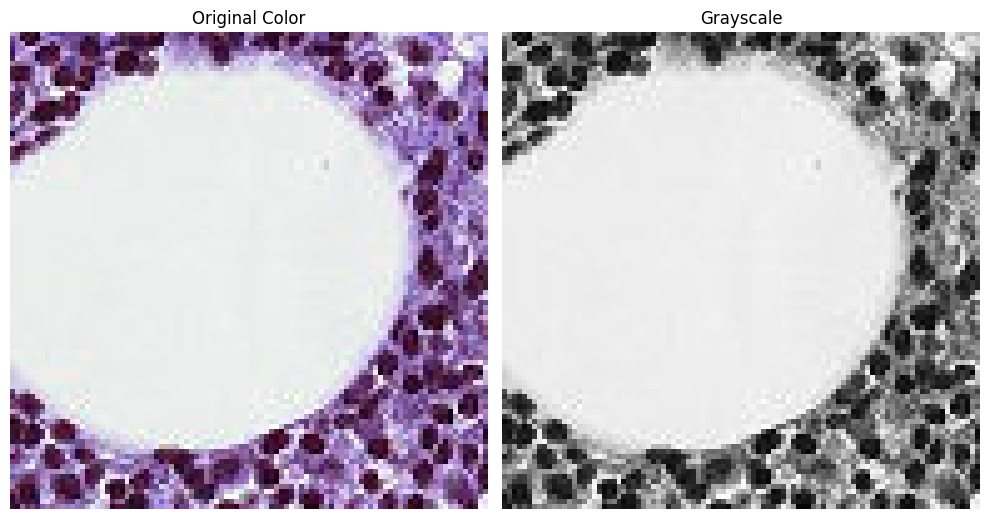

Displaying image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
Image Label:
CANCER


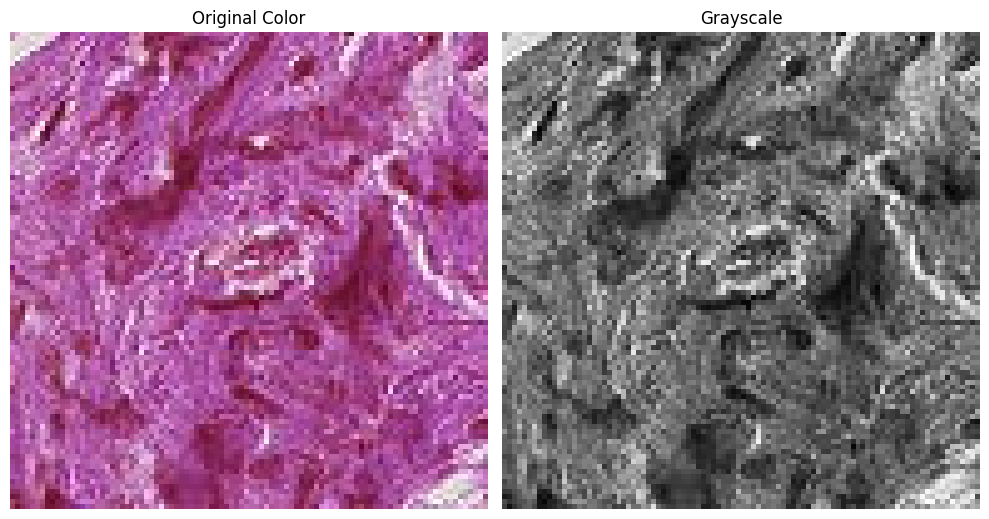

Displaying image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
Image Label:
CANCER


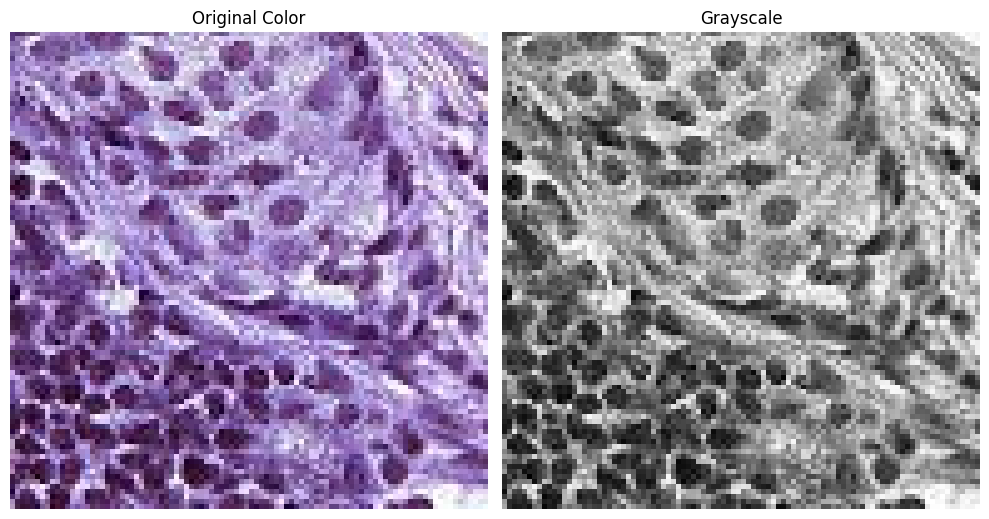

Displaying image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
Image Label:
NORMAL


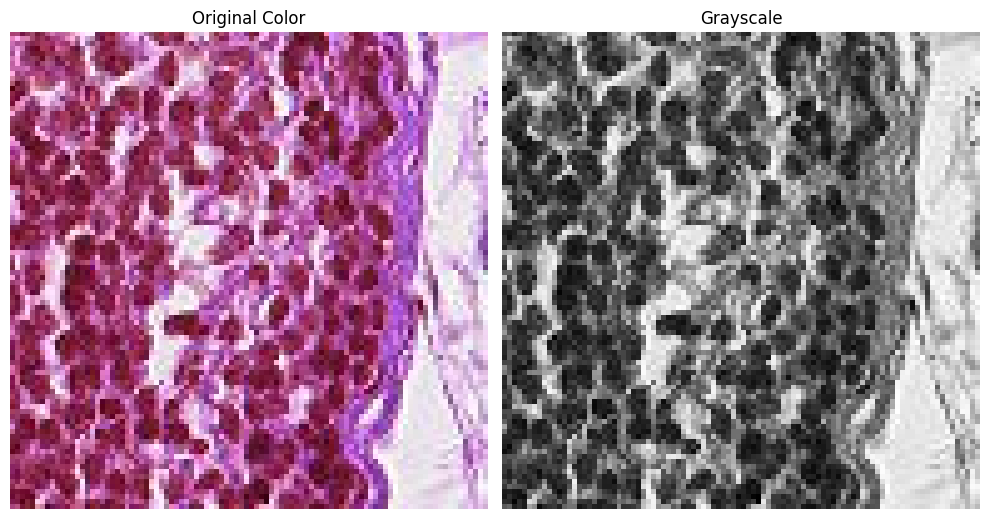

Displaying image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
Image Label:
NORMAL


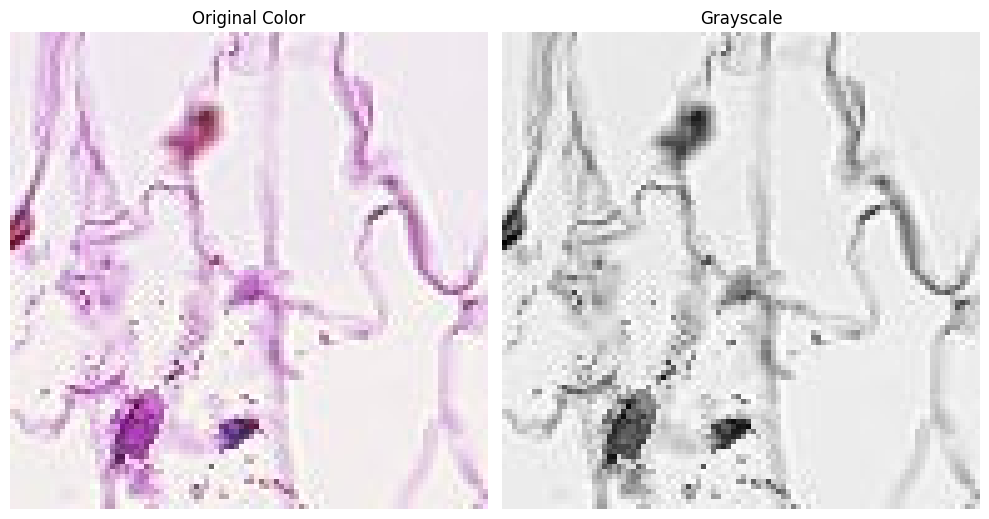

Displaying image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
Image Label:
CANCER


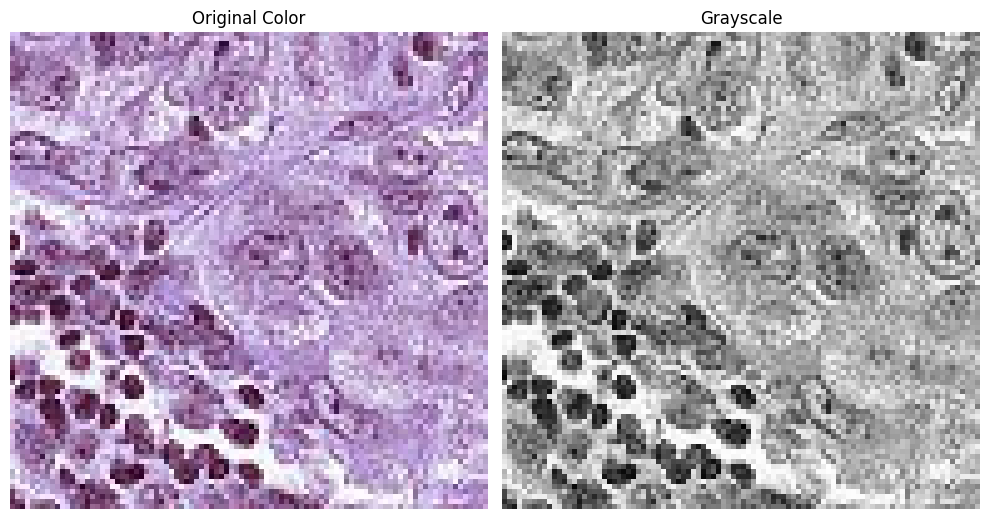

Displaying image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
Image Label:
NORMAL


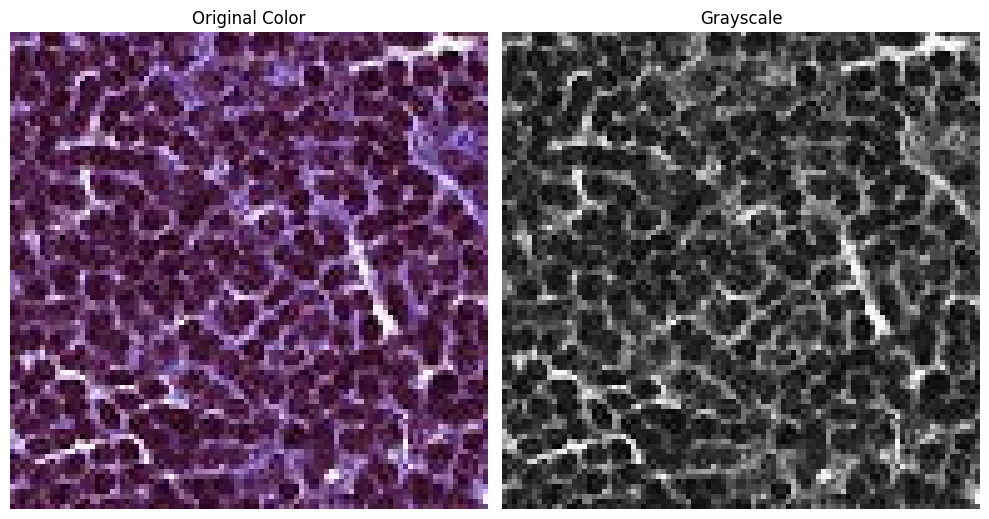

Displaying image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
Image Label:
NORMAL


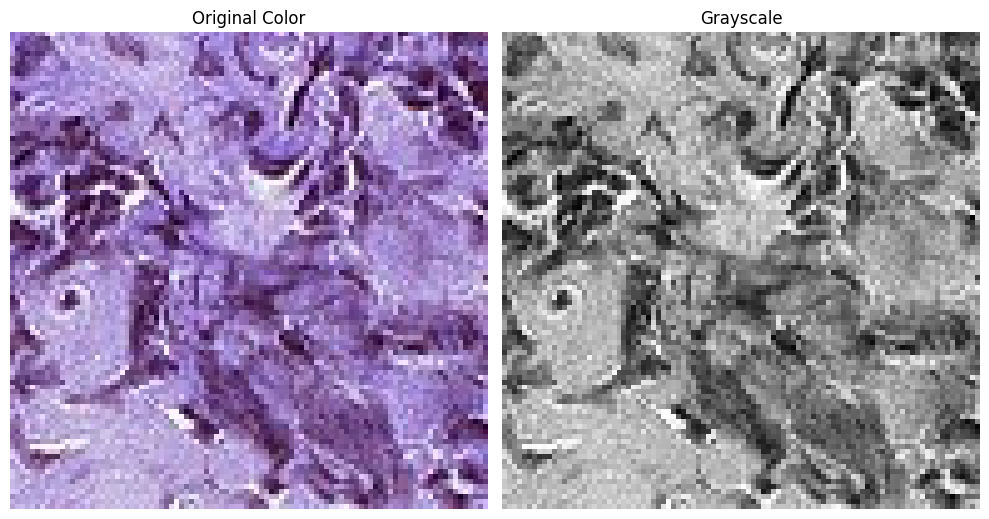

Displaying image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
Image Label:
CANCER


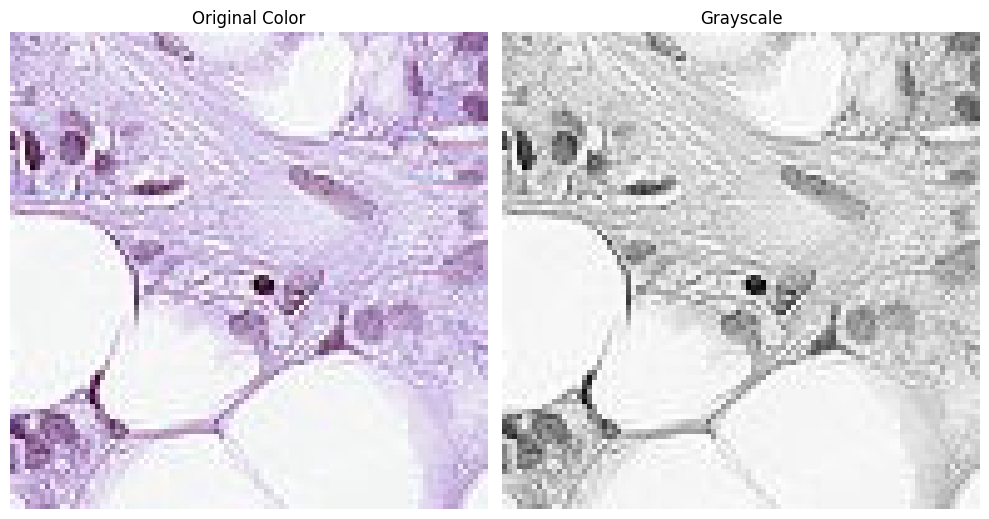

In [19]:
# Display a random image from the training set for verification purposes
# random_index = np.random.randint(0, x_train_norm.shape[0])
for i in file_indices:
    print(f"Displaying image at index: {i}")
    print(f"Image Name: {train_image_files[i] if DATA_LOAD == 'CANCER' else 'MNIST'}")

    image_cv = np.floor(x_train_norm[i] * 255).astype(np.uint8)
    label = "CANCER" if y_train[i] == 1 else "NORMAL"
    color_map = None

    image_gray = convert_to_grayscale(image_cv)

    # Side by side comparison of color to grayscale images
    f, ax = plt.subplots(1, 2, **{"figsize": (10, 10)})

    print(f"Image Label:\n{label}")
    ax[0].imshow(image_cv, cmap=color_map)
    ax[1].imshow(image_gray, cmap="gray")
    ax[0].set_title("Original Color")
    ax[1].set_title("Grayscale")
    ax[0].axis("off")
    ax[1].axis("off")
    plt.tight_layout()
    plt.show()

# Model Definition and Training

In this section, I will split up the datasets into a training and validation set, using test_train_split() function. I will use a validation set of 10% of the training dataset subset. The sample size of the training dataset will be 20,000 images, as the original dataset was too large to load into memory consistently. The validation set will be used to evaluate the model's performance during training, and the epoch history will be plotted for analysis and visualization of the model's performance and convergence speed and oscilation of the validation loss and accuracy.

In [ ]:
# Train test split the color and grayscale images for use in training all models
X_subset, y_subset = load_train_images(
    train_image_files,
    TRAIN_DIR,
    labels_df=y_df,  # y_train_df if available, otherwise None for test set
    target_size=(96, 96),
    start_index=0,
    batch_size=SAMPLE_SIZE,
    gray_scale=False,
    dtype=np.float16,  # np.float32 or np.float16
)
X_train_subset, X_val, y_train_subset, y_val = train_test_split(
    X_subset, y_subset, test_size=0.1, random_state=42
)
X_subset_gray, y_subset_gray = load_train_images(
    train_image_files,
    TRAIN_DIR,
    labels_df=y_df,  # y_train_df if available, otherwise None for test set
    target_size=(96, 96),
    start_index=0,
    batch_size=SAMPLE_SIZE,
    gray_scale=True,
    dtype=np.float16,  # np.float32 or np.float16
)
X_train_subset_gray, X_val_gray, y_train_gray_subset, y_gray_val = train_test_split(
    X_subset_gray, y_subset_gray, test_size=0.1, random_state=42
)

## Baseline Model

Below is a baseline model with 6 sets of convolutional layers, with 32, 32, 64, 64, 128, and 128 filters respectively. Between the odd to even layers, there is a normalization layer to ensure regularization of the model. Between the even to odd layers, there is a max pooling layer to reduce the dimensionality of the data. For the activation function, I will use ReLU, as it is a good baseline for most CNN architectures because it is computationally efficient and helps to avoid the vanishing gradient problem. 

Between the CNN layers and the classification layers, I chose to use a Global Average Pooling (GAP) layer to reduce the dimensionality further. Another benefit of using GAP is that I was able to use a Grad-CAM visualization technique to visualize the model's predictions by overlaying a heatmap on the original images to show which parts of the image are most important for the classification task. This technique will be used to help guide hyper parameter tuning changes based on my inferences from the heatmaps. If someone has more experience with CNN, they may be able to quickly identify an ideal architecture based on the heatmaps, but as we will see, I wasn't able to get much beyond the baseline model with my hyperparameter tuning.

The final set of layers is for the binary classification task. This backend model consists of a fully connected dense layer with 64 neurons and a ReLU activation function, followed by a final dense layer with 1 neuron (a single perceptron) and a sigmoid activation function, ideal for binary classification tasks. 

I didn't focus on the optimizer in the hyper parameter tuning, but I did use the Adam optimizer with a learning rate of 0.001. I wanted to use an optimizer that is computationally effective and widely used in CNN architectures and classificaitons models so I could focus on improving the architecture of the model during the hyperparameter tuning process.

In [27]:
# Define simple CNN model
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    Flatten,
    Dense,
    Dropout,
    GlobalAveragePooling2D,
)


model_color = Sequential(
    [
        # Convolutional layers for image feature extraction
        Conv2D(32, (3, 3), padding="same", activation="relu", input_shape=(96, 96, 3)),
        BatchNormalization(),
        Conv2D(32, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(128, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        # Classification layers
        GlobalAveragePooling2D(),
        Dropout(0.5),
        Dense(64, activation="relu"),
        Dense(1, activation="sigmoid", dtype="float32"),
    ]
)

model_gray = Sequential(
    [
        # Convolutional layers for image feature extraction
        Conv2D(32, (3, 3), padding="same", activation="relu", input_shape=(96, 96, 1)),
        BatchNormalization(),
        Conv2D(32, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(128, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        # Classification layers
        GlobalAveragePooling2D(),
        Dropout(0.5),
        Dense(64, activation="relu"),
        Dense(1, activation="sigmoid", dtype="float32"),
    ]
)

In [73]:
# Compile the model
model_color.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)
model_color.summary()

model_gray.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)
model_gray.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 96, 96, 32)        896       
                                                                 
 batch_normalization_42 (Ba  (None, 96, 96, 32)        128       
 tchNormalization)                                               
                                                                 
 conv2d_85 (Conv2D)          (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d_41 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_86 (Conv2D)          (None, 48, 48, 64)        18496     
                                                                 
 batch_normalization_43 (Ba  (None, 48, 48, 64)      

### Train the color model

In [74]:
# Trian on subset of training data
history = model_color.fit(
    X_train_subset,
    y_train_subset,
    epochs=30, # Change back to 30 after troubleshooting heat maps and datatypes
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)


Epoch 1/30
563/563 [==============================] - 15s 22ms/step - loss: 0.4339 - accuracy: 0.8160 - val_loss: 0.6473 - val_accuracy: 0.7505
Epoch 2/30
563/563 [==============================] - 12s 21ms/step - loss: 0.3682 - accuracy: 0.8453 - val_loss: 0.5047 - val_accuracy: 0.7685
Epoch 3/30
563/563 [==============================] - 12s 21ms/step - loss: 0.3348 - accuracy: 0.8623 - val_loss: 0.3996 - val_accuracy: 0.8350
Epoch 4/30
563/563 [==============================] - 12s 21ms/step - loss: 0.3163 - accuracy: 0.8719 - val_loss: 0.3562 - val_accuracy: 0.8540
Epoch 5/30
563/563 [==============================] - 12s 21ms/step - loss: 0.2955 - accuracy: 0.8784 - val_loss: 0.3388 - val_accuracy: 0.8645
Epoch 6/30
563/563 [==============================] - 12s 20ms/step - loss: 0.2757 - accuracy: 0.8888 - val_loss: 0.4667 - val_accuracy: 0.8195
Epoch 7/30
563/563 [==============================] - 12s 21ms/step - loss: 0.2620 - accuracy: 0.8951 - val_loss: 0.5127 - val_accuracy:

##### Color Model Evaluation Plot

Below is a plot of the accuracy for the training and validation sets over the epochs. The model was trained for 30 epochs, but stopped early due to overfitting on the training dataset. The validation accuracy is about 0.87, which I will use as the baseline to compare against the grayscale model. If the grayscale model performs sufficiently well, then I will use the grayscale images for the hyperparameter tuning process.

With this baseline model, I was able to plot each filter and the feature maps of sample images. The feature maps were hard to interpret, so I decided to use Grad-CAM to visualize the model's predictions instead. The Grad-CAM technique identifies the most important parts of the Global Average Pooling Layer's output for the classification task. I am then able to overlay a heatmap on the original image to identify which of the images features were most important for the classification task with the given architecture.

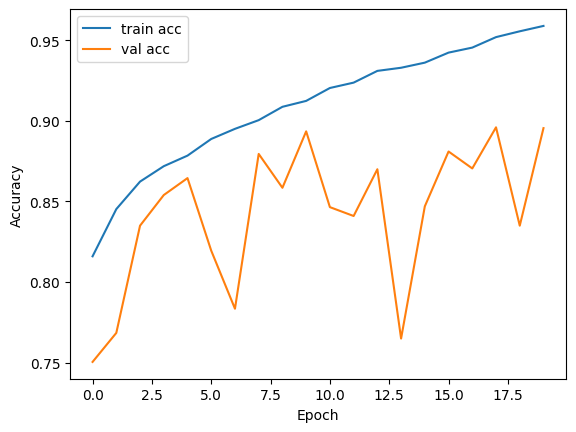

In [75]:

plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [76]:
# Save the model
model_name = get_model_name(model_color)
print(f"Model Name: {model_name}")
model_color.save(f"{MODEL_DIR}{model_name}.h5")

import pickle

with open(f"{MODEL_DIR}{model_name}_history.pkl", "wb") as f:
    pickle.dump(history.history, f)

# Capture model summary
summary_buffer = StringIO()
model_color.summary(print_fn=lambda x: summary_buffer.write(x + '\n'))
model_summary_str = summary_buffer.getvalue()
summary_buffer.close()

# Write to file
with open(f"{MODEL_DIR}{model_name}_performance.txt", "w") as f:
    f.write(f"Model Name: {model_name}\n")
    f.write(f"Input Shape: {model_color.input_shape[1:]}\n")
    f.write(f"Total Parameters: {model_color.count_params() // 1000}K\n")
    f.write(f"Optimizer: Adam\n")
    f.write(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
    f.write(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
    f.write("Model Summary:\n")
    f.write(model_summary_str)

Model Name: CNN_96x96x3_C32-32-64-64-128-128_FC64-1-GAP_relu_296K_adam


#### Visualize the model filters and feature maps

Running the code below will plot the filters and feature maps for the different convolutional layers in the model. The filters are the weights of the convolutional layers, and the feature maps are the output of the convolutional layers after the filters are applied. 

I struggled to interpret the feature maps and filters in a meaningful way, so I decided to use the Grad-CAM heatmap technique for all future visualizations, along with the accuracy plot during the training process. I found the Grad-CAM technique to be more interpretable and made the CNN architecture explainable. The black-box nature of CNNs is a challenge, but this visualization technique has the ability to provide insights to a novice in the medical field. However, it's still critical to ensure someone with domain knowledge and experience is involved int he model's development to ensure a model is capable of generalizing, applicable to the real-world, interpretable by medical professionals, explainable, and ethical and fair in its predictions.

##### Filter Activation Images

The images below are the filters of the convolutional layers in the color model. The filters are the trainable weights of convolutional neural networks. These filters were learned during the training process and are used to extract features from the input images. These features then propogate through the network to the classificaiton layers, where the final prediction is made.

Despite visualizing the filters, I'm not able to any insight into the model's performance or how the improve the architecture. That is why I will focus on the Grad-CAM technique from here on out, as it providses a more explainable and interpretable visualization of the model's behavior.

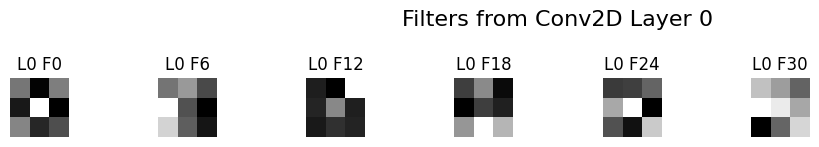

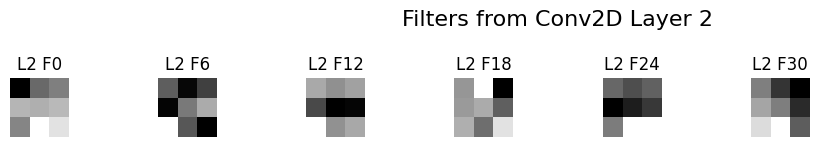

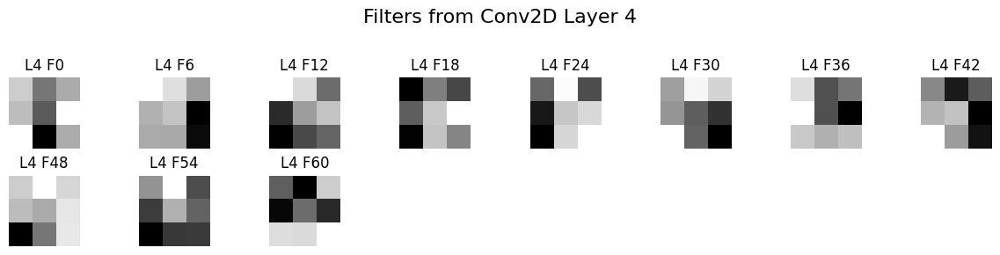

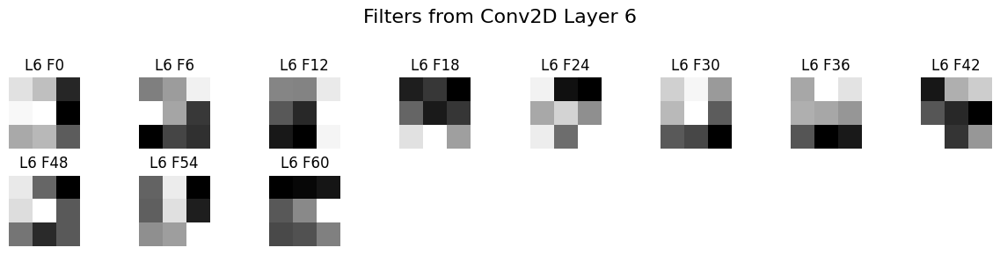

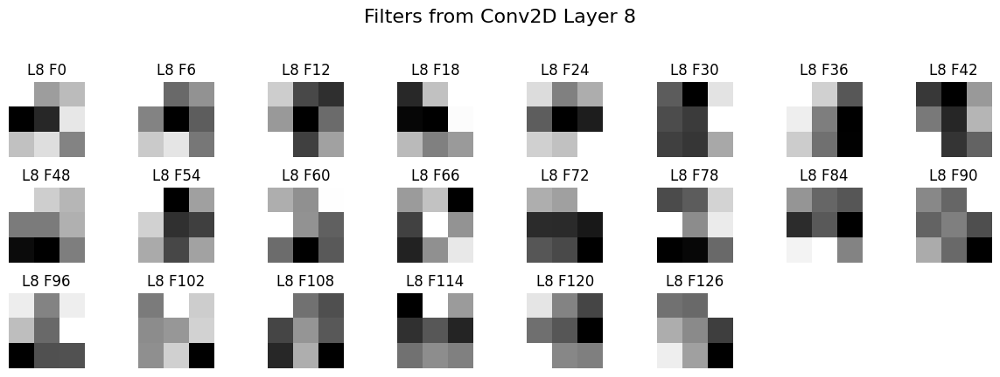

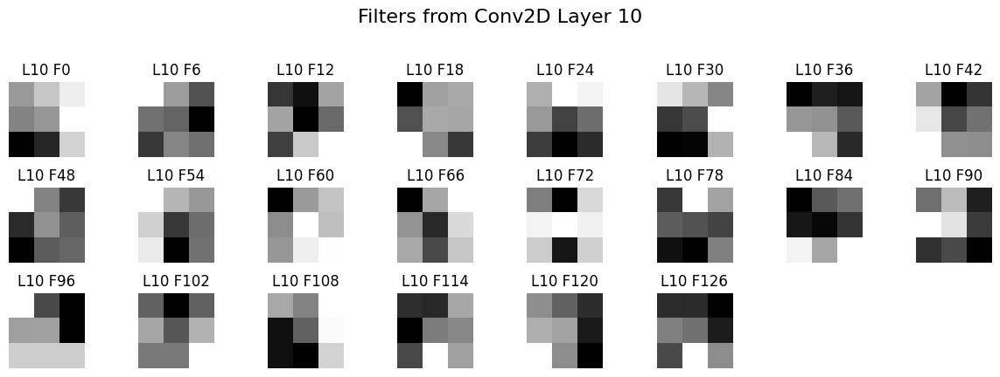

In [19]:
import matplotlib.pyplot as plt
# Load Model
model_color = load_model(MODEL_DIR + "CNN_96x96x3_C32-32-64-64-128-128_FC64-1_relu_1467K_adam_subset.h5")

sample_over = 6
filters_per_row = 8  # Controls horizontal layout

for layer_idx, layer in enumerate(model_color.layers):
    if isinstance(layer, Conv2D):
        filters, biases = layer.get_weights()
        n_filters = filters.shape[-1]

        # Set up figure
        n_cols = filters_per_row
        n_rows = -(-n_filters // (sample_over * n_cols))  # ceil division
        plt.figure(figsize=(1.5 * n_cols, 1.5 * n_rows))

        plot_idx = 1
        for i in range(0, n_filters, sample_over):
            f = filters[:, :, :, i]
            f_mean = f.mean(axis=-1)  # for RGB or multi-channel inputs

            plt.subplot(n_rows, n_cols, plot_idx)
            plt.imshow(f_mean, cmap='gray')
            plt.axis('off')
            plt.title(f"L{layer_idx} F{i}")
            plot_idx += 1

        plt.suptitle(f"Filters from Conv2D Layer {layer_idx}", fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()


##### Feature Map Images

Below are the feature maps for a single input image. These feature were created by passing the input image through the convolutional layers with the learned filters. The feature maps are then aggregated to a final output that is used for the classification task. With my lack of domain knowledge, I wasn't able to interpret the feature maps in a meaningful way. As explained before, I will  focus on the Grad-CAM techniques for all future visualizations, as I found this much more interpretable and explainable.

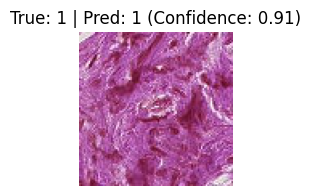

1/1 [==============================] - 0s 88ms/step


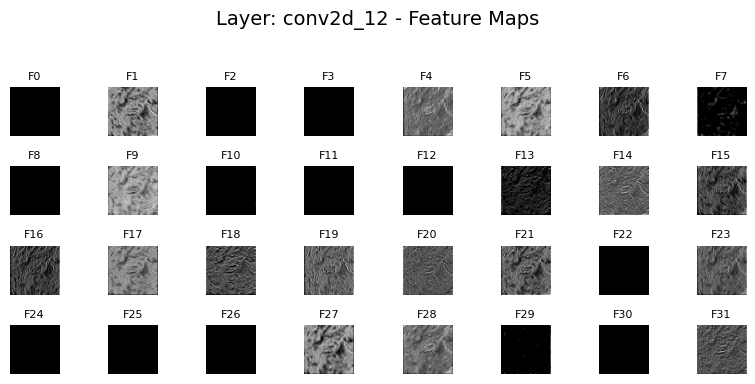

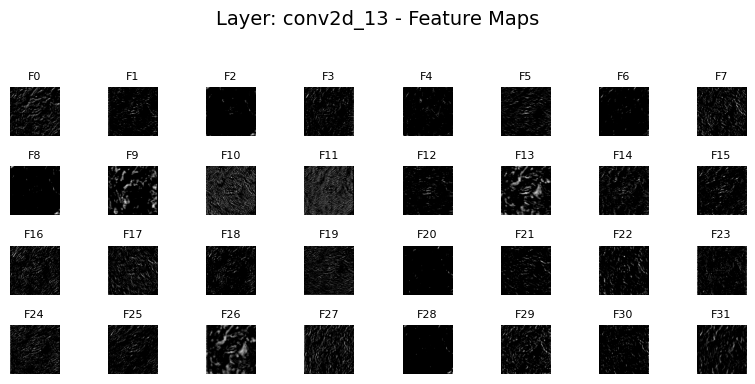

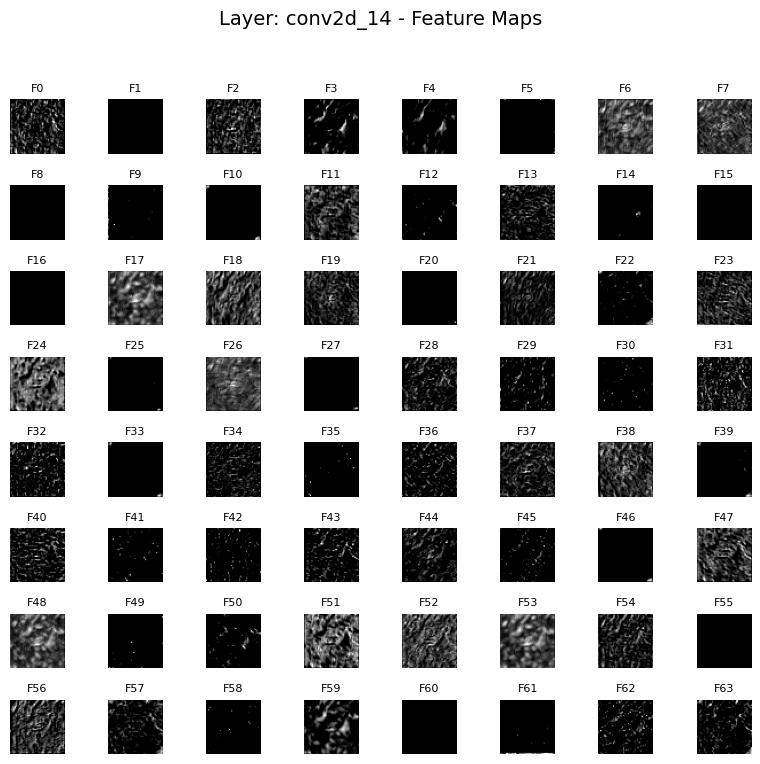

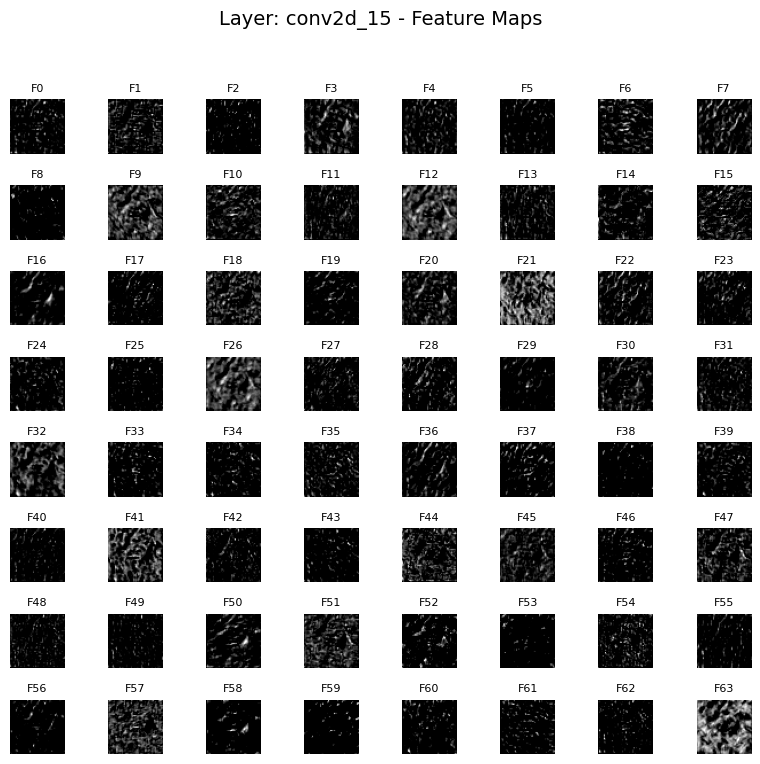

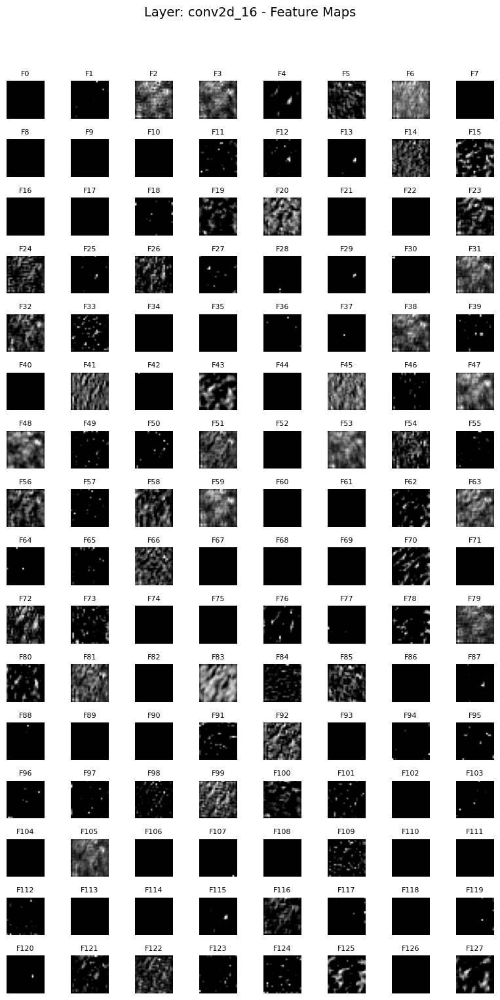

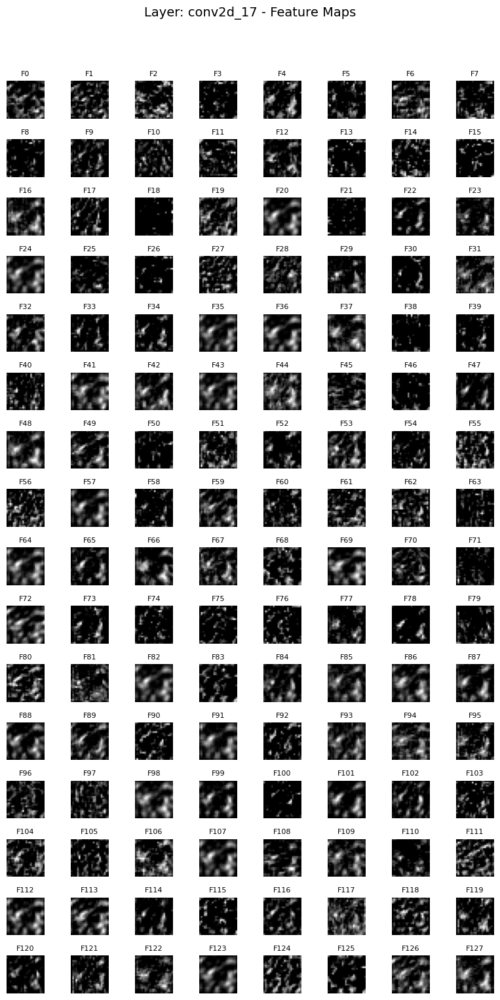

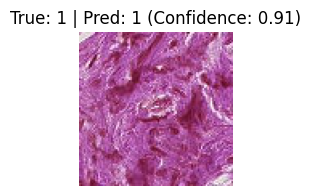

In [17]:
import matplotlib.pyplot as plt
from keras.models import Model
from keras.layers import Conv2D, Activation


INDEX = 1
for i in range(1,2):
    INDEX = i
    input_image = x_train_norm[
        file_indices[INDEX] : file_indices[INDEX] + 1
    ]  # Add batch dim

    # Predict class and confidence
    pred = model_color.predict(input_image, verbose=0)
    pred_class = 1 if pred[0][0] >= 0.5 else 0
    pred_confidence = pred[0][0] if pred_class == 1 else 1 - pred[0][0]

    # Display input image
    label = y_train[file_indices[INDEX]]  # Get label from y_train

    img_to_plot = input_image[0].squeeze()

    # Cast to float32 or uint8 depending on your range
    if img_to_plot.dtype not in [np.uint8, np.float32, np.float64]:
        if img_to_plot.max() <= 1.0:
            img_to_plot = img_to_plot.astype(np.float32)  # range [0, 1]
        else:
            img_to_plot = img_to_plot.astype(np.uint8)  # range [0, 255]

    plt.figure(figsize=(2, 2))
    plt.imshow(img_to_plot, cmap="gray")
    plt.axis("off")
    plt.title(f"True: {label} | Pred: {pred_class} (Confidence: {pred_confidence:.2f})")
    plt.show()

    # Extract intermediate layer outputs (conv & activation layers only)
    layer_outputs = []
    layer_names = []
    for layer in model_color.layers:
        if isinstance(layer, Conv2D) or isinstance(layer, Activation):
            layer_outputs.append(layer.output)
            layer_names.append(layer.name)

    # Create a model that outputs these layers
    feature_model = Model(inputs=model_color.input, outputs=layer_outputs)

    # Get feature maps
    feature_maps = feature_model.predict(input_image)

    # Plot feature maps layer by layer
    for fmap, lname in zip(feature_maps, layer_names):
        n_features = fmap.shape[-1]
        n_cols = 8
        n_rows = -(-n_features // n_cols)  # ceil div

        plt.figure(figsize=(1 * n_cols, 1 * n_rows))
        for i in range(n_features):
            plt.subplot(n_rows, n_cols, i + 1)
            plt.imshow(fmap[0, :, :, i], cmap="gray")
            plt.axis("off")
            plt.title(f"F{i}", fontsize=8)
        plt.suptitle(f"Layer: {lname} - Feature Maps", fontsize=14)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    if img_to_plot.dtype not in [np.uint8, np.float32, np.float64]:
        if img_to_plot.max() <= 1.0:
            img_to_plot = img_to_plot.astype(np.float32)  # range [0, 1]
        else:
            img_to_plot = img_to_plot.astype(np.uint8)  # range [0, 255]

    plt.figure(figsize=(2, 2))
    plt.imshow(img_to_plot, cmap="gray")
    plt.axis("off")
    plt.title(f"True: {label} | Pred: {pred_class} (Confidence: {pred_confidence:.2f})")
    plt.show()
    print("\n\n\n\n")
    

#### Visualize The Grad-CAM Heat Maps

I used the Grad-CAM technique for visualizing the output of the Global Average Pooling layer's input into the classification layer. This provided the ability to overlay a heatmap on the original image to identify which features in the image were most influential in the classification network. I don't have the domain knowledge to predict which features are most important to the label of the dataset; however, I found that the heatmaps were able to provide insights into some of the specific features that were triggering the classification. I was also able to identify issues where the model didn't have enough contextual information or were over reliant on the edges of an image. I was then able to use this information to guide the hyperparameter tuning process and improve the model's performance.

Processing image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
1/1 [==============================] - 0s 100ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0029


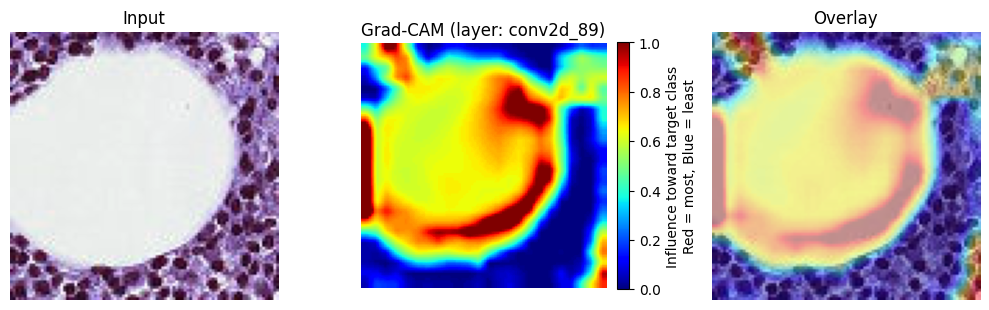

Processing image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
1/1 [==============================] - 0s 21ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.1018


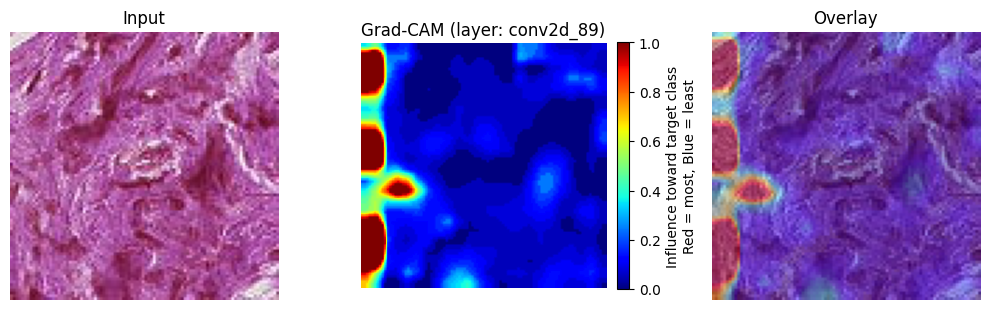

Processing image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
1/1 [==============================] - 0s 19ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0226


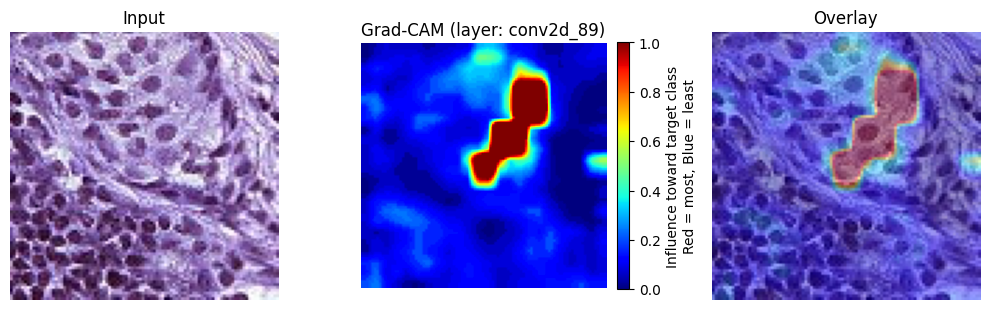

Processing image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
1/1 [==============================] - 0s 21ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0186


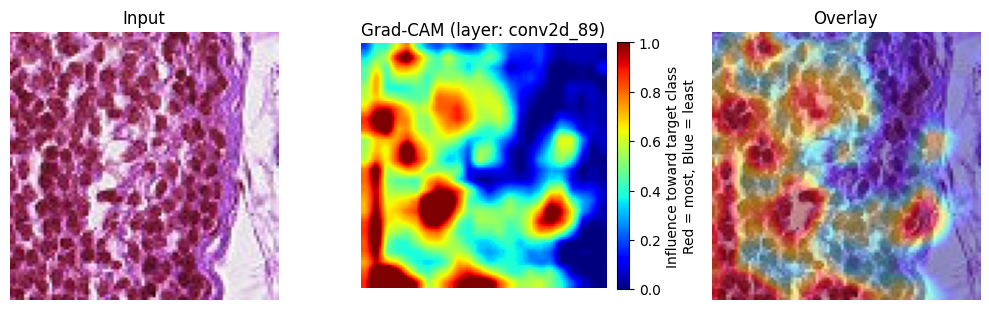

Processing image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
1/1 [==============================] - 0s 18ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0144


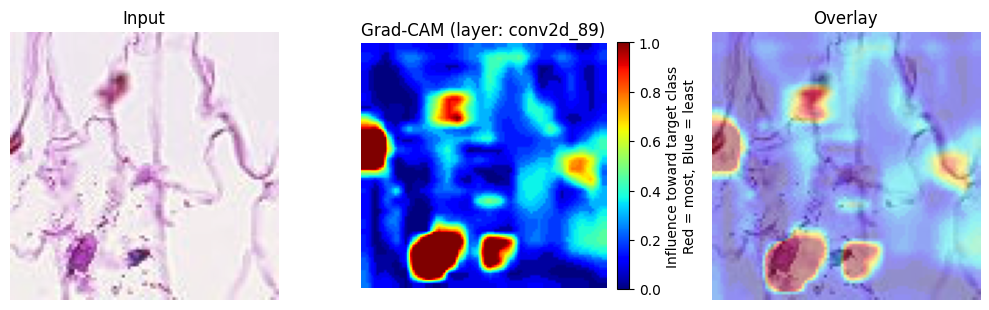

Processing image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
1/1 [==============================] - 0s 21ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9982


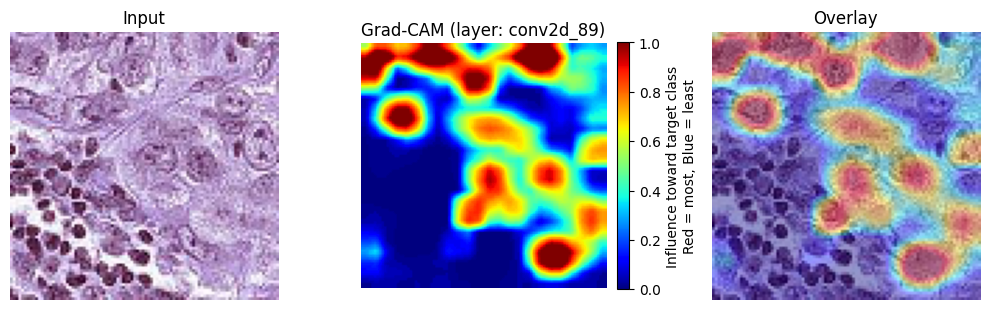

Processing image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
1/1 [==============================] - 0s 28ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0007


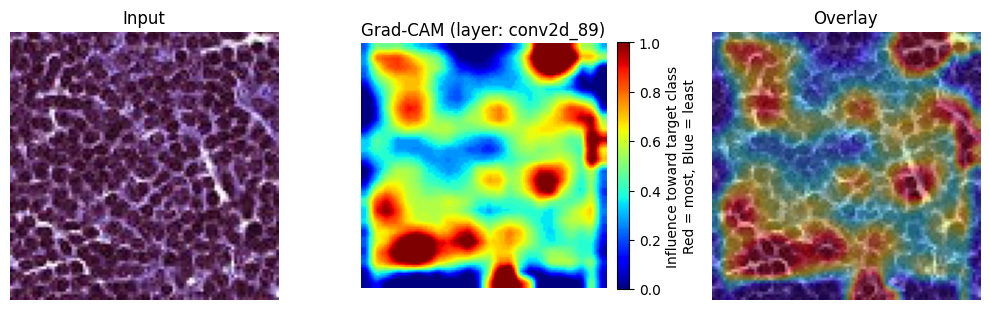

Processing image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
1/1 [==============================] - 0s 24ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.6207


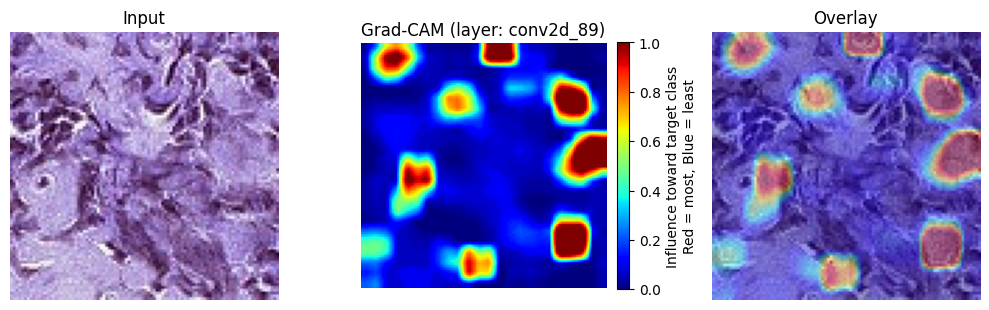

Processing image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
1/1 [==============================] - 0s 22ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.3536


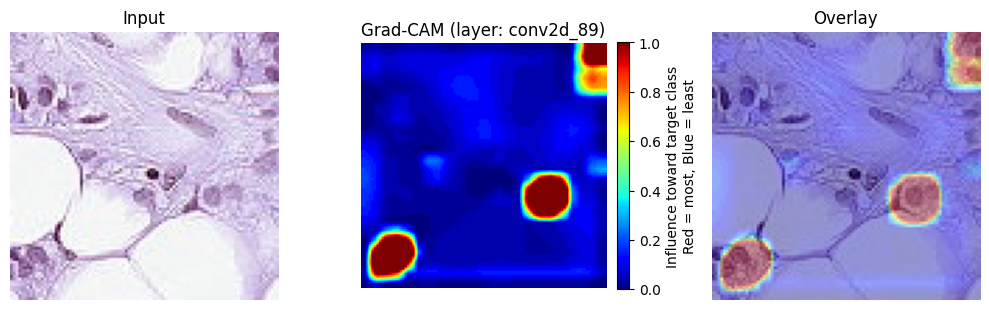

In [78]:
# Plot Heat Maps for samople images
for i in range(len(file_indices)):
    INDEX = i
    print(f"Processing image at index: {file_indices[INDEX]}")
    print(f"Image Name: {train_image_files[file_indices[INDEX]]}")

    # Get the image and predict class
    img = x_train_norm[file_indices[INDEX]]
    predict_class = model_color.predict(np.expand_dims(img, axis=0))
    predicted_prob = predict_class[0][0]
    predict_class = (predict_class >= 0.5).astype(int)[0][0]

    print(f"Actual Class: {y_train[file_indices[0]]}")
    print(f"Predicted Class: {predict_class}")
    print(f"Predicted Probability: {predicted_prob:.4f}")
    heatmap_rgb, overlay_rgb = gradcam_visualize_color(
        model_color,
        img,
        layer_name=None,  # auto-pick last Conv2D
        overlay_alpha=0.40,  # heatmap opacity on top of image
        contrast_stretch=True,  # percentile stretch for visibility
        show=True,
    )

### Train the Gray Model

During the training of the grayscale model, I used a 20000 image subset of the entire training dataset. Comparing this model's peformance with the full color model, I found the grayscale model to be slightly less accurate at 0.85 compared to the color model's validation accuracy of 0.87; however, since my computer doesn't load all the images into memory at once, I can train the grayscale model on a larger subset of the training data. I'll continue this project using grayscale images instead of the full color images. 

To verify the model is capable of generalizing, I submitted the predictions of the test set to Kaggle. I received a score of 0.8382 and 0.8503 for the public and private leaderboards, respectively. This will be the baseline model for future comparisons.

In [79]:
# Train on subset of training data
history = model_gray.fit(
    X_train_subset_gray,
    y_train_gray_subset,
    epochs=30,
    batch_size=32,
    validation_data=(X_val_gray, y_gray_val),
    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)


Epoch 1/30
563/563 [==============================] - 15s 21ms/step - loss: 0.5041 - accuracy: 0.7767 - val_loss: 0.8472 - val_accuracy: 0.6355
Epoch 2/30
563/563 [==============================] - 12s 21ms/step - loss: 0.4363 - accuracy: 0.8099 - val_loss: 0.5097 - val_accuracy: 0.7850
Epoch 3/30
563/563 [==============================] - 11s 20ms/step - loss: 0.3964 - accuracy: 0.8274 - val_loss: 0.4458 - val_accuracy: 0.7940
Epoch 4/30
563/563 [==============================] - 11s 20ms/step - loss: 0.3745 - accuracy: 0.8373 - val_loss: 0.4256 - val_accuracy: 0.8155
Epoch 5/30
563/563 [==============================] - 12s 22ms/step - loss: 0.3536 - accuracy: 0.8494 - val_loss: 0.6335 - val_accuracy: 0.6370
Epoch 6/30
563/563 [==============================] - 13s 23ms/step - loss: 0.3297 - accuracy: 0.8626 - val_loss: 0.4169 - val_accuracy: 0.8065
Epoch 7/30
563/563 [==============================] - 11s 20ms/step - loss: 0.3005 - accuracy: 0.8757 - val_loss: 0.3860 - val_accuracy:

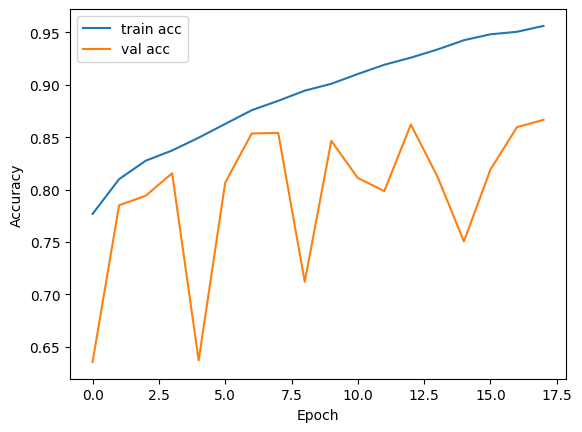

In [80]:

plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [81]:
# Save the model
model_name = get_model_name(model_gray) + "_grayscale"
print(f"Model Name: {model_name}")
model_gray.save(f"{MODEL_DIR}{model_name}.h5")

# Capture model summary
summary_buffer = StringIO()
model_gray.summary(print_fn=lambda x: summary_buffer.write(x + "\n"))
model_summary_str = summary_buffer.getvalue()
summary_buffer.close()

# Write to file
with open(f"{MODEL_DIR}{model_name}_performance.txt", "w") as f:
    f.write(f"Model Name: {model_name}\n")
    f.write(f"Input Shape: {model_gray.input_shape[1:]}\n")
    f.write(f"Total Parameters: {model_gray.count_params() // 1000}K\n")
    f.write(f"Optimizer: Adam\n")
    f.write(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
    f.write(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
    f.write("Model Summary:\n")
    f.write(model_summary_str)

Model Name: CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Predict on test set
model_gray = load_model(MODEL_DIR + "CNN_96x96x1_C32-32-64-64-128-128_FC64-1_relu_1467K_adam_grayscale_subset.h5")
baseline_df = get_test_predictions(
    model_gray,
    test_image_files,
    test_dir=TEST_DIR,
    target_size=(96, 96),
    batch_size=len(test_image_files),
    gray_scale=True,
    dtype=np.float16,
)
baseline_df.to_csv((SUB_DIR + "baseline_predictions_grayscale_subset.csv"), index=False)

#### Visualize the Grad-CAM Heatmaps for the grayscale model

Below are the Grad-CAM heatmaps for the grayscale model. The heatmaps are overlaid on the original grayscale images to help identify what features are the most critical for the classification tasks. I'm also able to determine if the model has enough contextual information, or if it has artifacts or over-reliance around the edges of the image that are influencing the classification task.

Processing image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
1/1 [==============================] - 0s 32ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0513


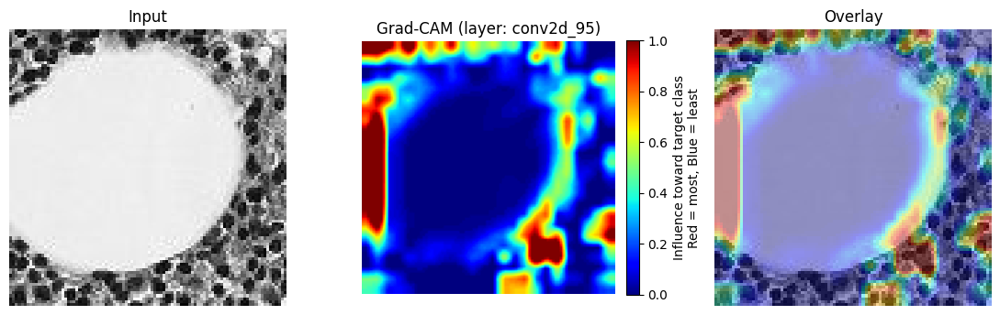

Processing image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
1/1 [==============================] - 0s 21ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9829


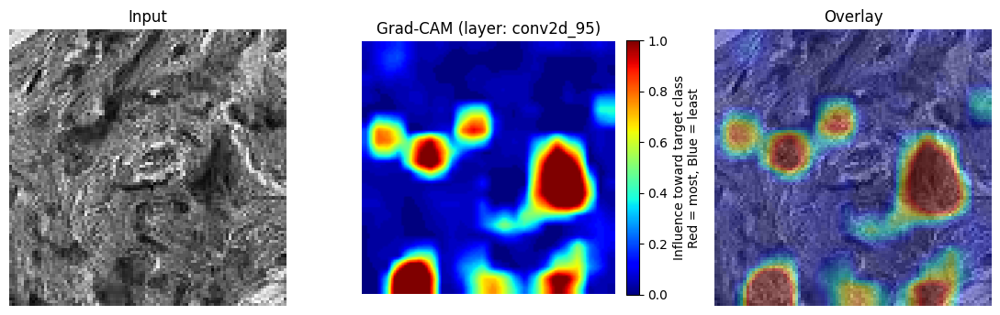

Processing image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.8942


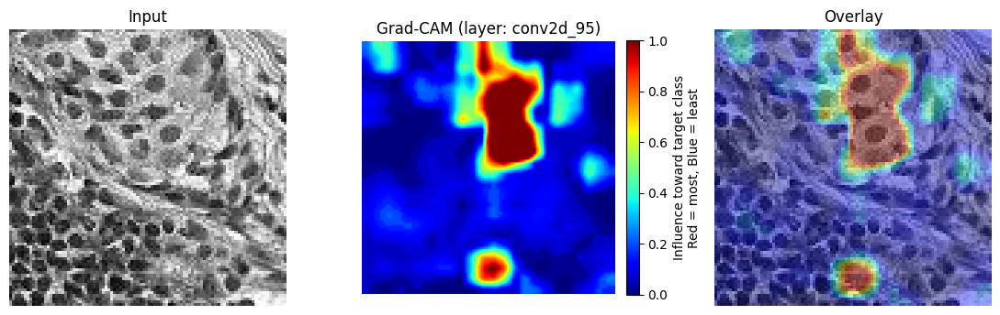

Processing image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
1/1 [==============================] - 0s 24ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0467


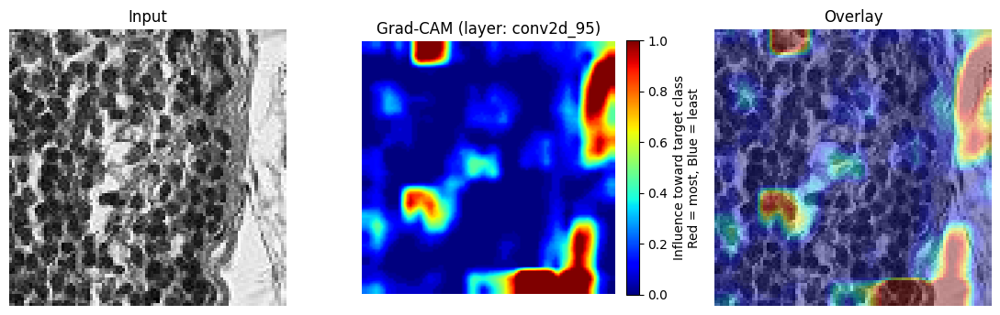

Processing image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
1/1 [==============================] - 0s 32ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0186


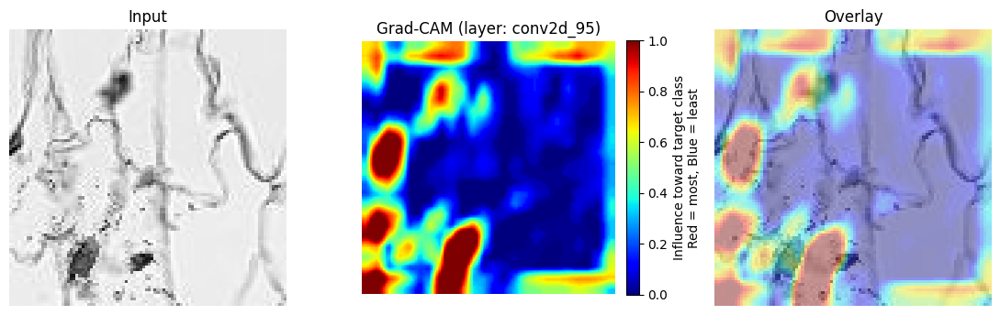

Processing image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
1/1 [==============================] - 0s 18ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9767


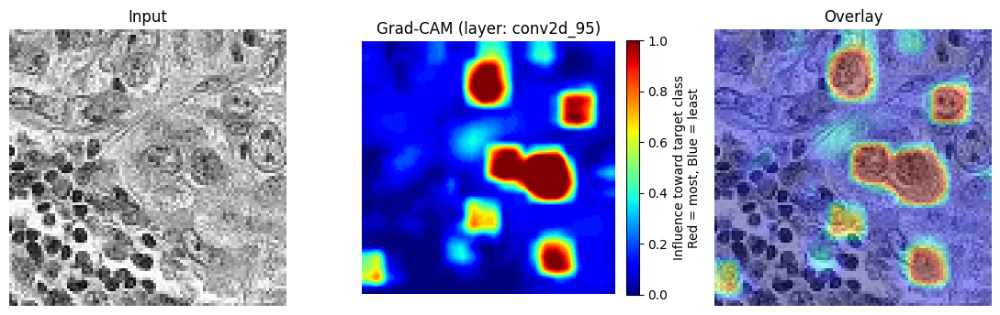

Processing image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
1/1 [==============================] - 0s 20ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0126


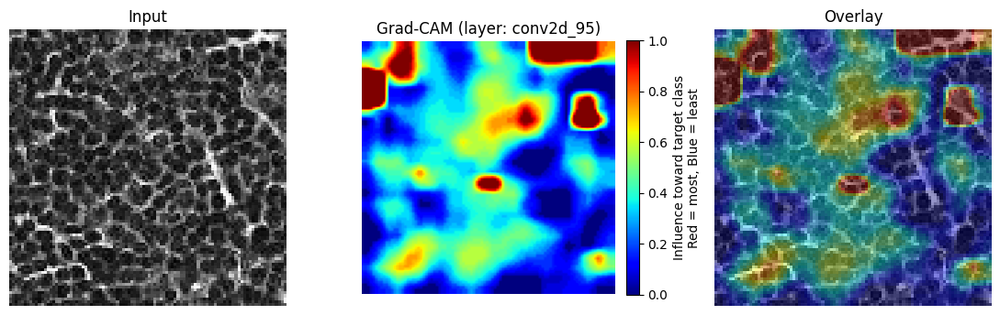

Processing image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
1/1 [==============================] - 0s 18ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9763


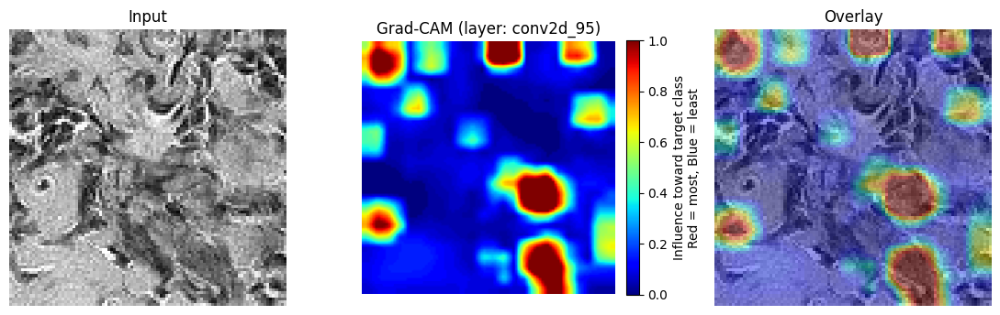

Processing image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
1/1 [==============================] - 0s 19ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.6586


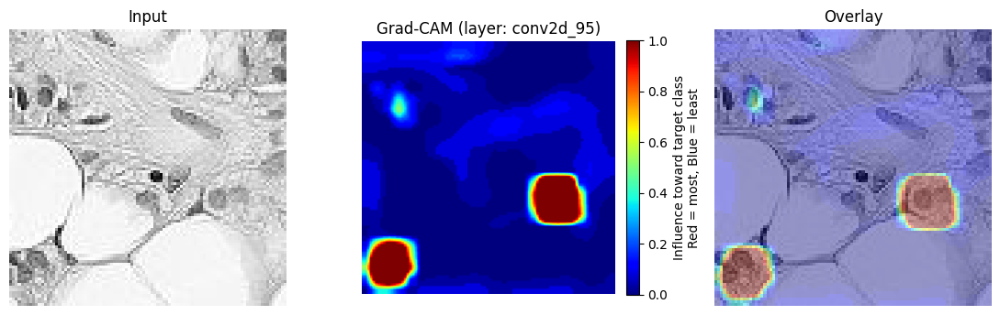

In [88]:
#### Visualize Grad-CAM for grayscale images
for i in range(len(file_indices)):
    INDEX = i
    print(f"Processing image at index: {file_indices[INDEX]}")
    print(f"Image Name: {train_image_files[file_indices[INDEX]]}")

    # Get the image and predict class
    img = x_train_norm_gray[file_indices[INDEX]]
    predict_class = model_gray.predict(np.expand_dims(img, axis=0))
    predicted_prob = predict_class[0][0]
    predict_class = (predict_class >= 0.5).astype(int)[0][0]

    print(f"Actual Class: {y_train[file_indices[0]]}")
    print(f"Predicted Class: {predict_class}")
    print(f"Predicted Probability: {predicted_prob:.4f}")
    heatmap_rgb, overlay_rgb = gradcam_visualize(
        model_gray,
        img,
        layer_name=None,  # auto-pick last Conv2D
        overlay_alpha=0.40,  # heatmap opacity on top of image
        contrast_stretch=True,  # percentile stretch for visibility
        show=True,
    )

# HyperParameter Tuning and Architecture Exploration

To enable visualization of the model's feature maps and activation of the classification layer. I'll modify the model to use Global Average Pooling 2D instead of flattening the output of the convolutional layers. This will enable me to use GradCAM to visualize the model's feature maps and the activation of the classification layer.

There were a few issues that I identified while looking at the heatmaps of the grayscale model. In the images as index 1288 and 11057, the model was over-reliant on the edges of the image, which doesn't appear to be the most important feature for the classfication task, from a novice's perspective. I think an improvement in the architecture would help reduce the model's reliance on the edges of the image.

There were also examples in images with index 8427 and 15985 where the orignal image was very homogeneous; however, the heatmaps were inconsistent and highlighting on parts of the image that don't appear significantly diffferent than other parts of the image. I think this is due to the model not having enough contextual information. 

To address these two main issues I will make several design decisions on the architecture of the model. 
- [x] Increase kernel size in last convolutional layer to 5x5
- [x] Additional Convolutional layer with 128 filters
- [x] Remove Convolutional layer with 64 fiters
- [x] Remove Dense layer with 64 neurons
- [x] Dropout to 0.3 from 0.5

In the rest of the section, I'll explore the changes to the architecture and how they impact the model's performance. I will make only one change at a time to ensure I can identify the impact of each change on the model's performance, as I don't have much experience with CNN architectures and the ramifications of the changes to the model's performance.

I'll summarize the performance of each model and the baseline model in the table below:
| Model Description | Validation Accuracy | Public Kaggle Accuracy | Private Kaggle Accuracy |
|-------------------|---------------------|--------------------|---------------------|
| Grayscale Model Baseline| ~0.85 | 0.8382 | 0.8503 |
|Increase last layer kernel size from 3 to 5 in the last convolutional layer | ~0.85 | 0.8149 | 0.8397 |
| Additional CNN layers | ~0.86|0.8106|0.8207|
|Remove Convolutional layer with 64 fiters |~0.77|0.8082|0.8211|
|Remove Dense layer with 64 neurons |~0.85|0.7932|0.8100|
| Dropout to 0.3 from 0.5 |~0.86|0.8378|0.8411|
| Grayscale Model Entire Dataset | ~0.93 | 0.8423 | 0.8636 |



#### Increase last layer kernel size from 3 to 5 in the last convolutional layer

I increased the kernel size in the last convolutional layer from 3x3 to 5x5. I wanted to see if the additional context from the larger kernel size would help the model to better identify the features in the images from additional contextual information. 

The model's performance on the validation set was essentially the same as the baseline model. Despite having more parameters, the model's performance didn't improve on the validation set. However, on the test set, the accuracy decreased to 0.8149 and 0.8397 for the public and private leaderboards, respectively. This is a significant decrease in performance. There were more parameters to be tuned in this model, so I conclude that the model is overfitting on the training dataset; hence the decrease in performance on the test dataset. I don't understand why I didn't see the issue in the validation set, but it's possible that the validation set isn't sufficiently representative of the test set.

Looking at the heatmaps, I saw that there was less reliance on the edges of the images. Also, it had more consistent highlighting of features amoung the images that appear more homogeneous in nature. This is a positive sign that the model is learning the features of the images, rather than relying on artifacts or edges of the images. I'll attempt to identify why model is overfitting on the training dataset, and how to improve the model's performance on the test dataset in future architecture iterations.



In [110]:
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    ReLU,
    GlobalAveragePooling2D,
    Dense,
    Dropout,
)

model_gray_last_conv_kernel_from_3_to_5 = Sequential(
    [
        Conv2D(32, 3, padding="same", input_shape=(96, 96, 1), activation="relu"),
        BatchNormalization(),
        Conv2D(32, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(64, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(128, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(128, 5, padding="same", activation="relu"),   # Increased to kernel size of 5 from 3. Will it help capture more context in homogeneous features?. Index 1288, 15985
        MaxPooling2D(2),
        GlobalAveragePooling2D(),
        Dropout(0.5),
        Dense(64, activation="relu"),
        Dense(1, activation="sigmoid", dtype="float32"),  # Output layer for binary classification
    ]
)
# model_gray_last_conv_kernel_from_3_to_5_
model_gray_last_conv_kernel_from_3_to_5.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"],
)
model_name = get_model_name(model_gray_last_conv_kernel_from_3_to_5) + "_grayscale_gap"
model_name = "model_gray_last_conv_kernel_from_3_to_5_" + model_name
print(f"Model Name: {model_name}")
print("Model Summary:")
model_gray_last_conv_kernel_from_3_to_5.summary()


Model Name: model_gray_last_conv_kernel_from_3_to_5_CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_557K_adam_grayscale_gap
Model Summary:
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_132 (Conv2D)         (None, 96, 96, 32)        320       
                                                                 
 batch_normalization_81 (Ba  (None, 96, 96, 32)        128       
 tchNormalization)                                               
                                                                 
 conv2d_133 (Conv2D)         (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d_61 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_134 (Conv2D)         (None, 48, 48, 6

In [111]:
history = model_gray_last_conv_kernel_from_3_to_5.fit(
    X_train_subset_gray,
    y_train_gray_subset,
    validation_data=(X_val_gray, y_gray_val),
    epochs=30,
    batch_size=32,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    ],
)

Epoch 1/30
563/563 [==============================] - 14s 22ms/step - loss: 0.5123 - accuracy: 0.7741 - val_loss: 0.5760 - val_accuracy: 0.7075
Epoch 2/30
563/563 [==============================] - 12s 22ms/step - loss: 0.4415 - accuracy: 0.8041 - val_loss: 0.4463 - val_accuracy: 0.7955
Epoch 3/30
563/563 [==============================] - 12s 22ms/step - loss: 0.4017 - accuracy: 0.8254 - val_loss: 0.4677 - val_accuracy: 0.7960
Epoch 4/30
563/563 [==============================] - 12s 22ms/step - loss: 0.3718 - accuracy: 0.8378 - val_loss: 0.5735 - val_accuracy: 0.7180
Epoch 5/30
563/563 [==============================] - 12s 22ms/step - loss: 0.3512 - accuracy: 0.8487 - val_loss: 0.5736 - val_accuracy: 0.6810
Epoch 6/30
563/563 [==============================] - 12s 21ms/step - loss: 0.3247 - accuracy: 0.8641 - val_loss: 0.3999 - val_accuracy: 0.8250
Epoch 7/30
563/563 [==============================] - 12s 22ms/step - loss: 0.3042 - accuracy: 0.8737 - val_loss: 0.3538 - val_accuracy:

Model Name: model_gray_last_conv_kernel_from_3_to_5_CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_557K_adam_grayscale_gap
Model and history saved as model_gray_last_conv_kernel_from_3_to_5_CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_557K_adam_grayscale_gap.


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


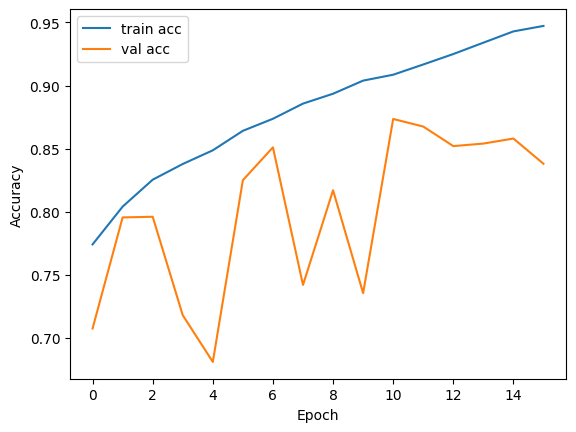

In [112]:
print(f"Model Name: {model_name}")
save_model_and_history(
    model_gray_last_conv_kernel_from_3_to_5,
    history,
    model_name=model_name,
    model_dir=MODEL_DIR,
)
plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Processing image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
1/1 [==============================] - 0s 147ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0184


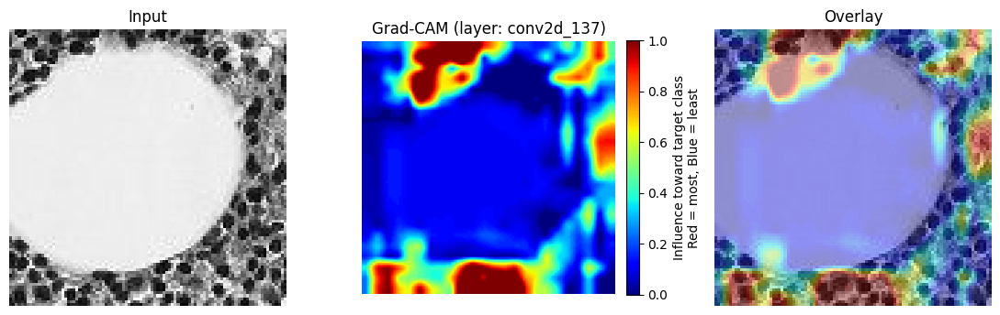

Processing image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
1/1 [==============================] - 0s 26ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.7722


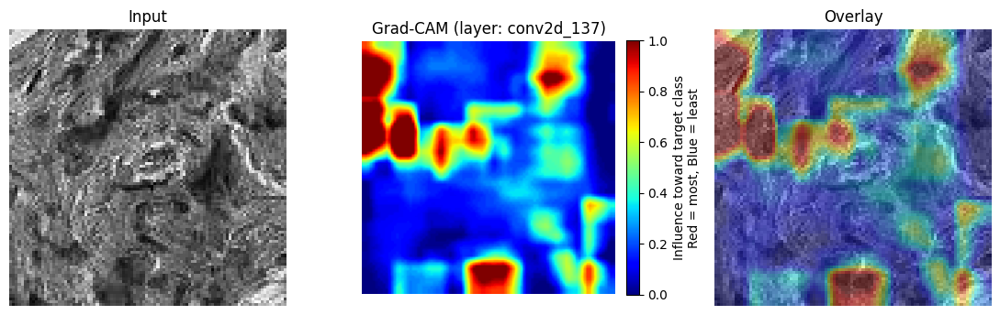

Processing image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.5977


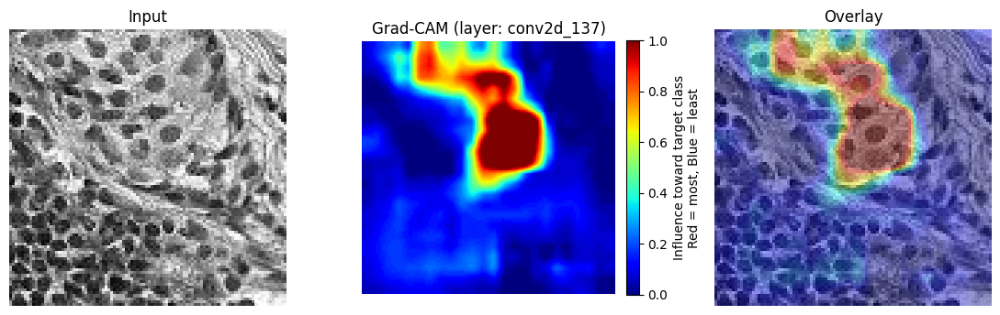

Processing image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0171


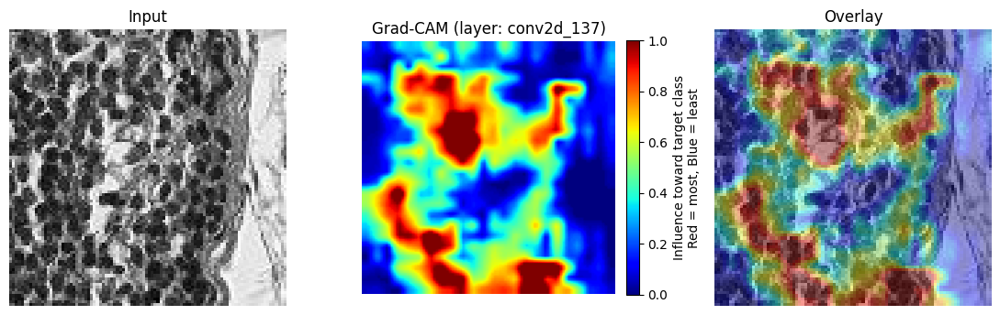

Processing image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
1/1 [==============================] - 0s 30ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0122


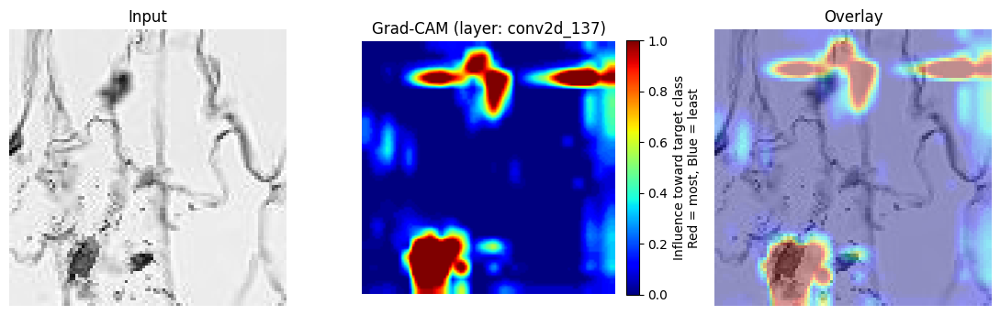

Processing image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
1/1 [==============================] - 0s 26ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.8715


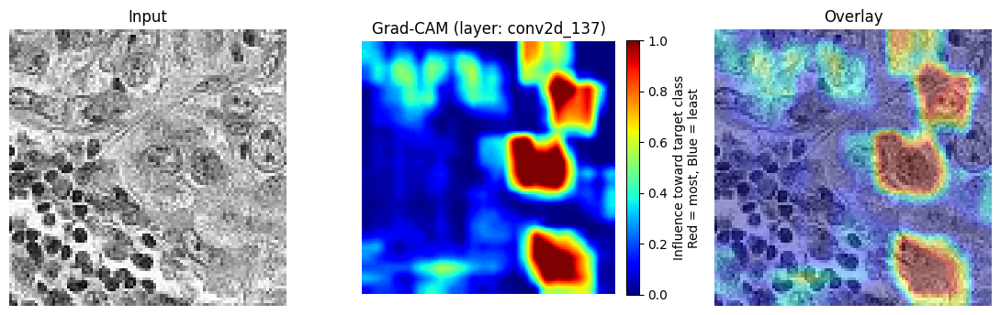

Processing image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0117


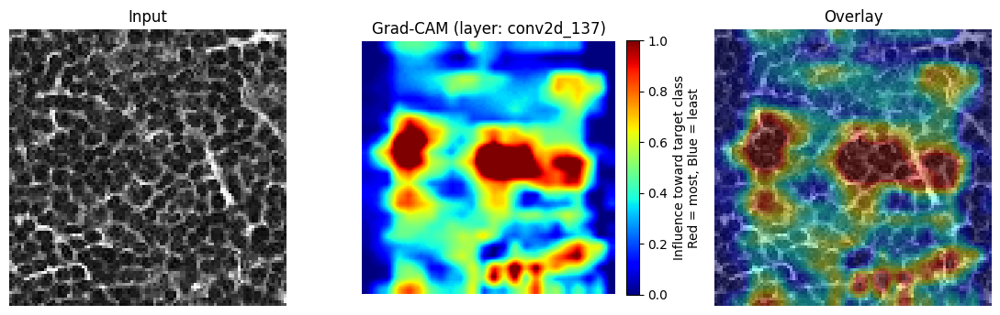

Processing image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.8504


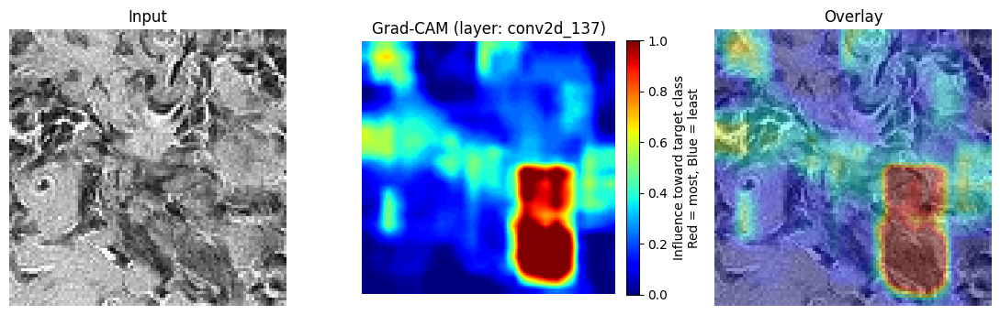

Processing image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9162


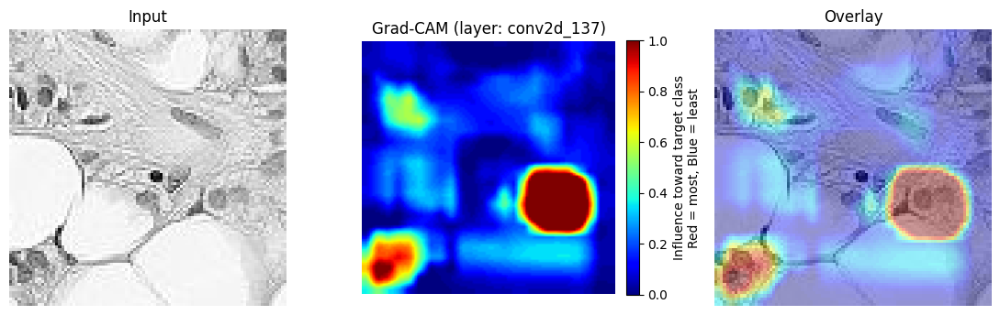

In [113]:
plot_heat_maps(
    model_gray_last_conv_kernel_from_3_to_5,
    x_train_norm_gray,
    y_train,
    train_image_files,
    file_indices=file_indices,
)

#### Added additional Conv2D layer to the backend of the baseline model

I chose to add an additional Conv2d layer with 256 filters to the backend of the baseline model. This was to see if the additional complexity would help the model to have better contextual information and the improve the model's performance. The model's validation accuracy was about 0.86, at the peak of the training process. However, the validation loss was oscillating, and the model was overfitting on the training dataset. This implies that I either need to reduce the complexity of the model, increase the amount of training data. I will attempt a smaller model with less complexity than the baseline model to see if I can improve the model's performance on the validation and test datasets.

The Kaggle submission for this model was 0.8106 and 0.8207 for the public and private leaderboards, respectively. This is worse than the baseline model and I believe it's due to the increased complexity of the model and the relatively small training dataset.

In [22]:
model_name = "model_gray_additional_conv2d_layer_CNN_96x96x1_C32-32-64-64-128-128-256-256_FC64-1-GAP_relu_1190K_adam_grayscale_gap"
model = load_model(MODEL_DIR + model_name + ".h5")
model_df = get_test_predictions(
    model,
    test_image_files,
    test_dir=TEST_DIR,
    target_size=(96, 96),
    batch_size=len(test_image_files),
    gray_scale=True,
    dtype=np.float16,
)
# to csv
model_df.to_csv((SUB_DIR + model_name + "_predictions.csv"), index=False)

Loading 57458 images from /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Week 3/data/test/...
Processed 10000 images out of 57458...
Current memory usage: 8190.74 MB
Percent Completed: 17.40%
Expected memory usage: 1959.68 MB
Processed 20000 images out of 57458...
Current memory usage: 8543.95 MB
Percent Completed: 34.81%
Expected memory usage: 1994.56 MB
Processed 30000 images out of 57458...
Current memory usage: 8897.31 MB
Percent Completed: 52.21%
Expected memory usage: 2006.49 MB
Processed 40000 images out of 57458...
Current memory usage: 9252.25 MB
Percent Completed: 69.62%
Expected memory usage: 2014.72 MB
Processed 50000 images out of 57458...
Current memory usage: 9607.37 MB
Percent Completed: 87.02%
Expected memory usage: 2019.87 MB
898/898 [==============================] - 11s 12ms/step


In [114]:
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    ReLU,
    GlobalAveragePooling2D,
    Dense,
    Dropout,
)

model_gray_additional_conv2d_layer = Sequential(
    [
        Conv2D(32, 3, padding="same", input_shape=(96, 96, 1), activation="relu"),
        BatchNormalization(),
        Conv2D(32, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(64, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(128, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(128, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        # Added additional conv2d layer to increase model complexity
        Conv2D(256, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(256, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        GlobalAveragePooling2D(),
        Dropout(0.5),
        Dense(64, activation="relu"),
        Dense(1, activation="sigmoid", dtype="float32"),  # Output layer for binary classification
    ]
)

model_gray_additional_conv2d_layer.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"],
)
model_name = get_model_name(model_gray_additional_conv2d_layer) + "_grayscale_gap"
model_name = "model_gray_additional_conv2d_layer_" + model_name
print(f"Model Name: {model_name}")
print("Model Summary:")
model_gray_additional_conv2d_layer.summary()


Model Name: model_gray_additional_conv2d_layer_CNN_96x96x1_C32-32-64-64-128-128-256-256_FC64-1-GAP_relu_1190K_adam_grayscale_gap
Model Summary:
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_138 (Conv2D)         (None, 96, 96, 32)        320       
                                                                 
 batch_normalization_84 (Ba  (None, 96, 96, 32)        128       
 tchNormalization)                                               
                                                                 
 conv2d_139 (Conv2D)         (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d_64 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_140 (Conv2D)         (None, 48, 4

In [117]:
history = model_gray_additional_conv2d_layer.fit(
    X_train_subset_gray,
    y_train_gray_subset,
    validation_data=(X_val_gray, y_gray_val),
    epochs=30,
    batch_size=32,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    ],
)

Epoch 1/30
563/563 [==============================] - 17s 23ms/step - loss: 0.5383 - accuracy: 0.7626 - val_loss: 0.5659 - val_accuracy: 0.6995
Epoch 2/30
563/563 [==============================] - 13s 22ms/step - loss: 0.4338 - accuracy: 0.8099 - val_loss: 0.6201 - val_accuracy: 0.6785
Epoch 3/30
563/563 [==============================] - 12s 22ms/step - loss: 0.4002 - accuracy: 0.8268 - val_loss: 0.3942 - val_accuracy: 0.8315
Epoch 4/30
563/563 [==============================] - 12s 22ms/step - loss: 0.3636 - accuracy: 0.8439 - val_loss: 0.8395 - val_accuracy: 0.7035
Epoch 5/30
563/563 [==============================] - 13s 22ms/step - loss: 0.3357 - accuracy: 0.8584 - val_loss: 0.8742 - val_accuracy: 0.6665
Epoch 6/30
563/563 [==============================] - 13s 23ms/step - loss: 0.3165 - accuracy: 0.8684 - val_loss: 0.4067 - val_accuracy: 0.8275
Epoch 7/30
563/563 [==============================] - 13s 23ms/step - loss: 0.2948 - accuracy: 0.8773 - val_loss: 0.4270 - val_accuracy:

Model Name: model_gray_additional_conv2d_layer_CNN_96x96x1_C32-32-64-64-128-128-256-256_FC64-1-GAP_relu_1190K_adam_grayscale_gap
Model and history saved as model_gray_additional_conv2d_layer_CNN_96x96x1_C32-32-64-64-128-128-256-256_FC64-1-GAP_relu_1190K_adam_grayscale_gap.


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


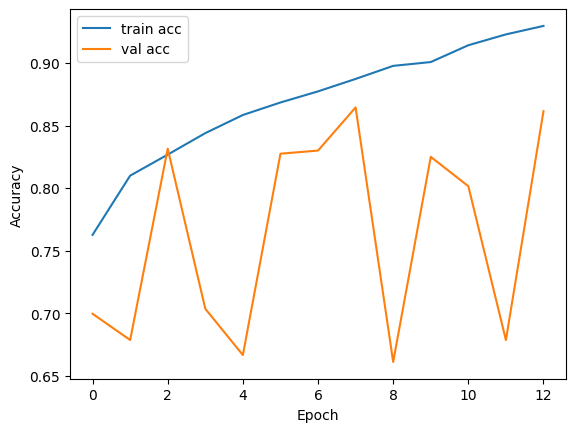

In [118]:
print(f"Model Name: {model_name}")
save_model_and_history(
    model_gray_additional_conv2d_layer,
    history,
    model_name=model_name,
    model_dir=MODEL_DIR,
)
plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Processing image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0141


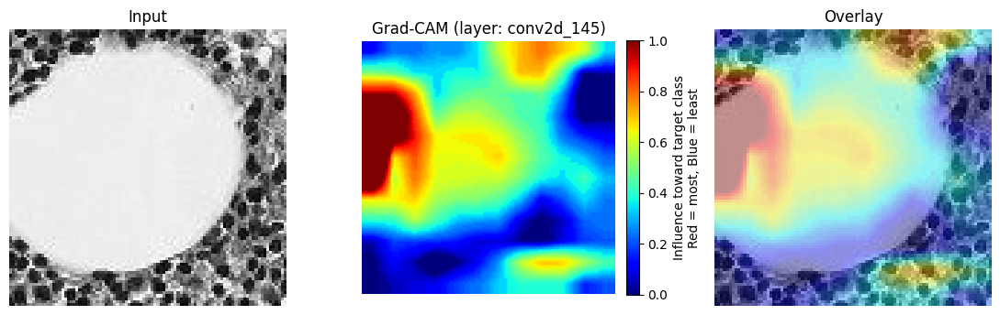

Processing image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
1/1 [==============================] - 0s 22ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9007


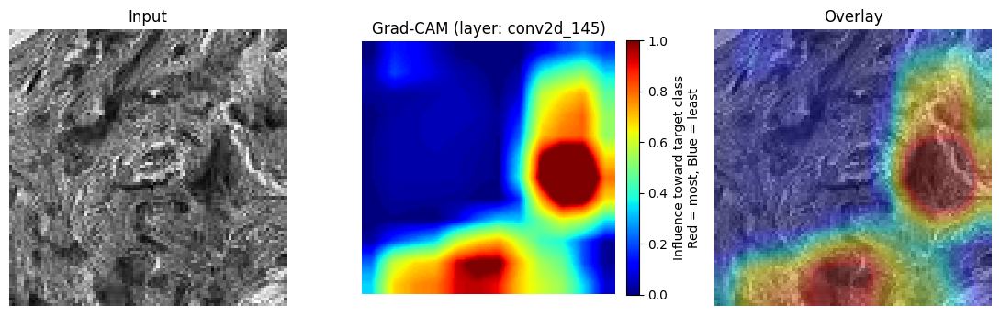

Processing image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
1/1 [==============================] - 0s 26ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.6158


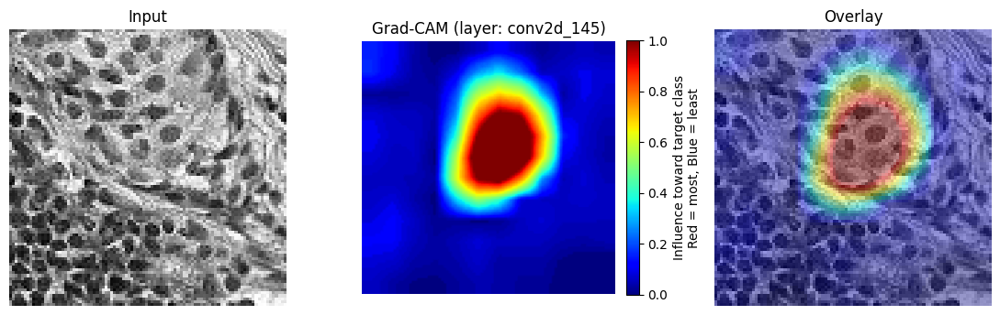

Processing image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
1/1 [==============================] - 0s 26ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0299


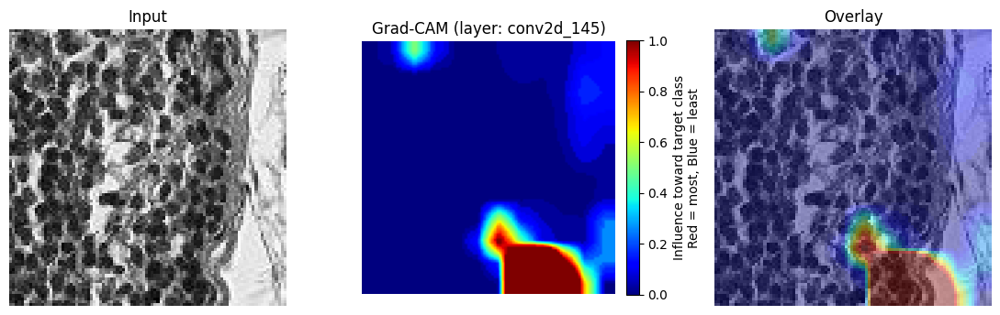

Processing image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0169


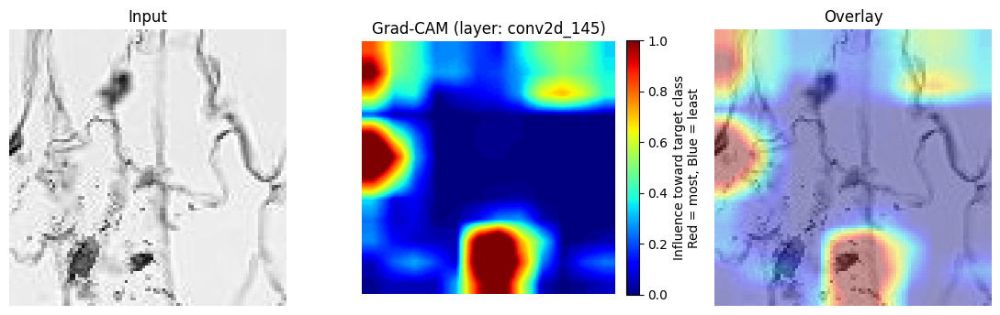

Processing image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9856


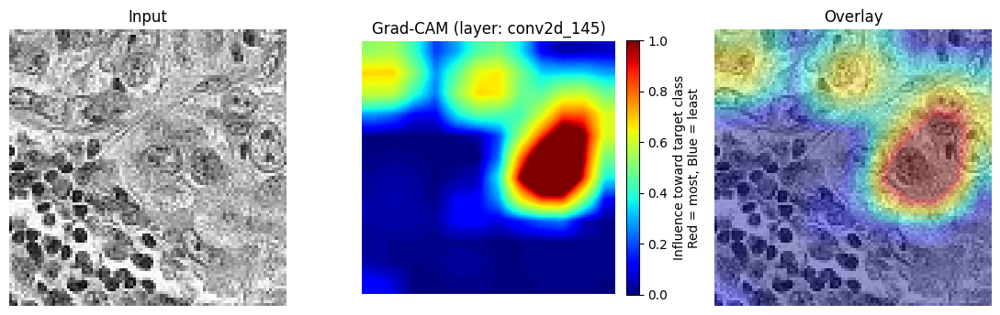

Processing image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
1/1 [==============================] - 0s 29ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0119


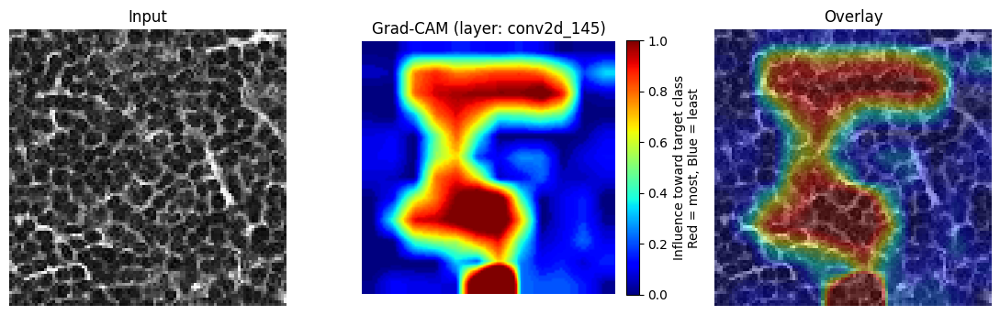

Processing image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.8501


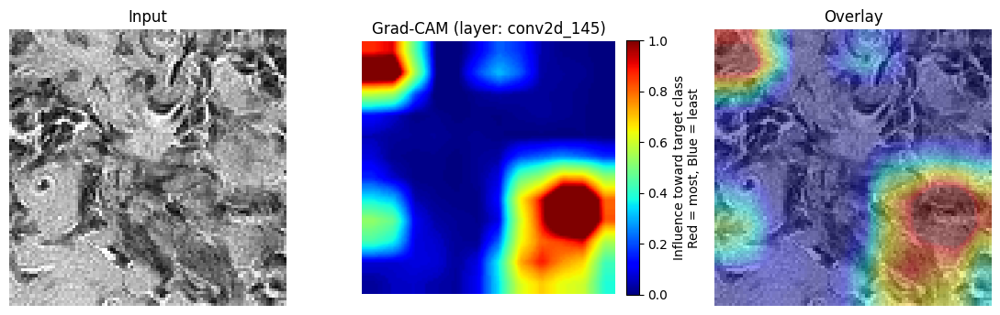

Processing image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.5912


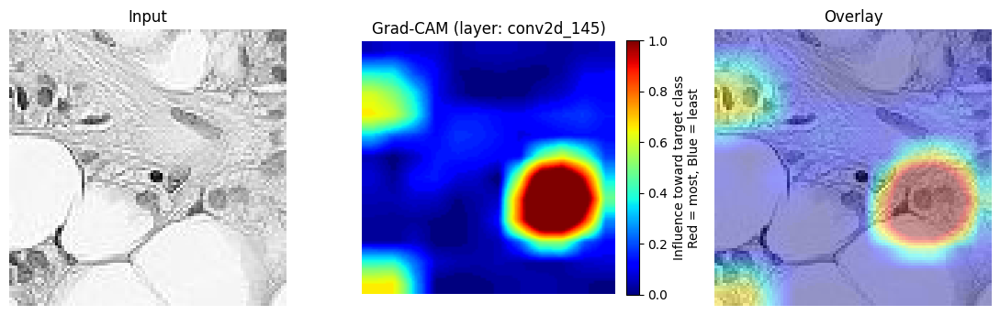

In [119]:
plot_heat_maps(
    model_gray_additional_conv2d_layer,
    x_train_norm_gray,
    y_train,
    train_image_files,
    file_indices=file_indices,
)

#### Reduce model complexity by removing last 2 conv2d layer

This model is less complex than the baseline and it's visible in the heat maps. There are very localized features that are highlighted and much of the context is ignored. The model's validation accuracy was about 0.77, which is worse than the baseline model. I believe this is due to the model not having enough complexity to learn the features of the images. The model is no longer overfitting on the training dataset, but it doesn't have enough complexity to learn the critical features of the images.

The Kaggle submission for this model was 0.8082 and 0.8211 for the public and private leaderboards, respectively. 

In [23]:

model_name = "model_gray_removed_conv2d_layers_CNN_96x96x1_C32-32-64-64_FC64-1-GAP_relu_69K_adam_grayscale_gap"
model = load_model(MODEL_DIR + model_name + ".h5")
model_df = get_test_predictions(
    model,
    test_image_files,
    test_dir=TEST_DIR,
    target_size=(96, 96),
    batch_size=len(test_image_files),
    gray_scale=True,
    dtype=np.float16,
)
# to csv
model_df.to_csv((SUB_DIR + model_name + "_predictions.csv"), index=False)

Loading 57458 images from /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Week 3/data/test/...
Processed 10000 images out of 57458...
Current memory usage: 9899.64 MB
Percent Completed: 17.40%
Expected memory usage: 8.62 MB
Processed 20000 images out of 57458...
Current memory usage: 9902.27 MB
Percent Completed: 34.81%
Expected memory usage: 11.85 MB
Processed 30000 images out of 57458...
Current memory usage: 9904.89 MB
Percent Completed: 52.21%
Expected memory usage: 12.93 MB
Processed 40000 images out of 57458...
Current memory usage: 9907.89 MB
Percent Completed: 69.62%
Expected memory usage: 14.01 MB
Processed 50000 images out of 57458...
Current memory usage: 9910.71 MB
Percent Completed: 87.02%
Expected memory usage: 14.44 MB
898/898 [==============================] - 8s 8ms/step


In [ ]:
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    ReLU,
    GlobalAveragePooling2D,
    Dense,
    Dropout,
)

model_gray_removed_conv2d_layers = Sequential(
    [
        Conv2D(32, 3, padding="same", input_shape=(96, 96, 1), activation="relu"),
        BatchNormalization(),
        Conv2D(32, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(64, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        # Conv2D(128, 3, padding="same", activation="relu"),
        # BatchNormalization(),
        # Conv2D(128, 3, padding="same", activation="relu"),  
		# MaxPooling2D(2),
        GlobalAveragePooling2D(),
        Dropout(0.5),
        Dense(64, activation="relu"),
        Dense(1, activation="sigmoid", dtype="float32"),  # Output layer for binary classification
    ]
)
# model_gray_removed_conv2d_layers
model_gray_removed_conv2d_layers.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"],
)
model_name = get_model_name(model_gray_removed_conv2d_layers) + "_grayscale_gap"
model_name = "model_gray_removed_conv2d_layers_" + model_name
print(f"Model Name: {model_name}")
print("Model Summary:")
model_gray_removed_conv2d_layers.summary()


Model Name: model_gray_removed_conv2d_layers_CNN_96x96x1_C32-32-64-64_FC64-1-GAP_relu_69K_adam_grayscale_gap
Model Summary:
Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_146 (Conv2D)         (None, 96, 96, 32)        320       
                                                                 
 batch_normalization_88 (Ba  (None, 96, 96, 32)        128       
 tchNormalization)                                               
                                                                 
 conv2d_147 (Conv2D)         (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d_68 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_148 (Conv2D)         (None, 48, 48, 64)        18496 

In [121]:
history = model_gray_removed_conv2d_layers.fit(
    X_train_subset_gray,
    y_train_gray_subset,
    validation_data=(X_val_gray, y_gray_val),
    epochs=30,
    batch_size=32,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    ],
)

Epoch 1/30
563/563 [==============================] - 12s 19ms/step - loss: 0.4949 - accuracy: 0.7791 - val_loss: 0.7567 - val_accuracy: 0.6095
Epoch 2/30
563/563 [==============================] - 10s 18ms/step - loss: 0.4571 - accuracy: 0.7969 - val_loss: 0.5029 - val_accuracy: 0.7695
Epoch 3/30
563/563 [==============================] - 10s 18ms/step - loss: 0.4368 - accuracy: 0.8094 - val_loss: 0.4311 - val_accuracy: 0.8145
Epoch 4/30
563/563 [==============================] - 10s 18ms/step - loss: 0.4152 - accuracy: 0.8213 - val_loss: 0.4677 - val_accuracy: 0.7820
Epoch 5/30
563/563 [==============================] - 11s 19ms/step - loss: 0.4012 - accuracy: 0.8244 - val_loss: 0.5030 - val_accuracy: 0.7575
Epoch 6/30
563/563 [==============================] - 10s 17ms/step - loss: 0.3866 - accuracy: 0.8329 - val_loss: 0.4636 - val_accuracy: 0.8050
Epoch 7/30
563/563 [==============================] - 10s 18ms/step - loss: 0.3721 - accuracy: 0.8384 - val_loss: 0.5501 - val_accuracy:

Model Name: model_gray_removed_conv2d_layers_CNN_96x96x1_C32-32-64-64_FC64-1-GAP_relu_69K_adam_grayscale_gap
Model and history saved as model_gray_removed_conv2d_layers_CNN_96x96x1_C32-32-64-64_FC64-1-GAP_relu_69K_adam_grayscale_gap.


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


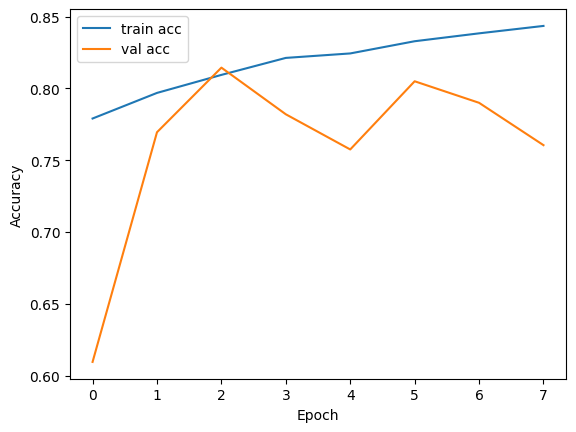

In [122]:
print(f"Model Name: {model_name}")
save_model_and_history(
    model_gray_removed_conv2d_layers,
    history,
    model_name=model_name,
    model_dir=MODEL_DIR,
)
plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Processing image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
1/1 [==============================] - 0s 93ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.1119


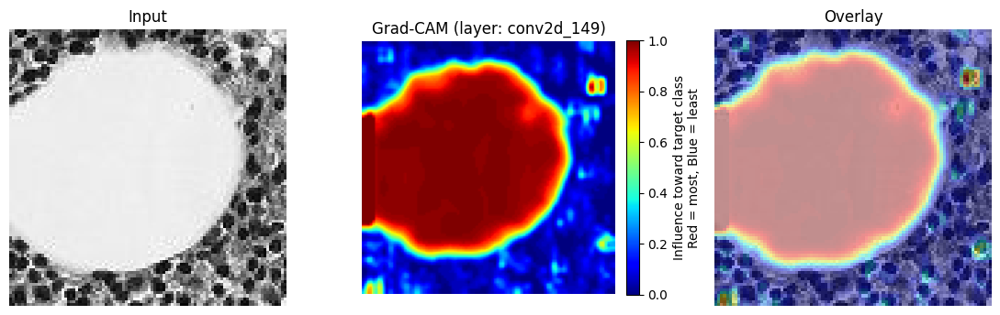

Processing image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
1/1 [==============================] - 0s 22ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9844


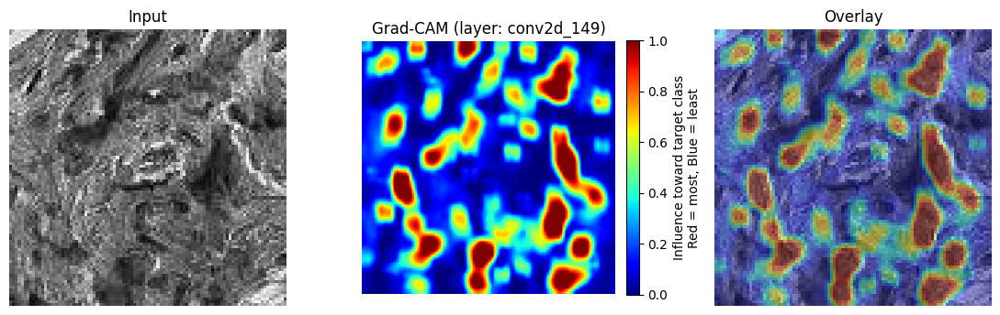

Processing image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
1/1 [==============================] - 0s 23ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.7010


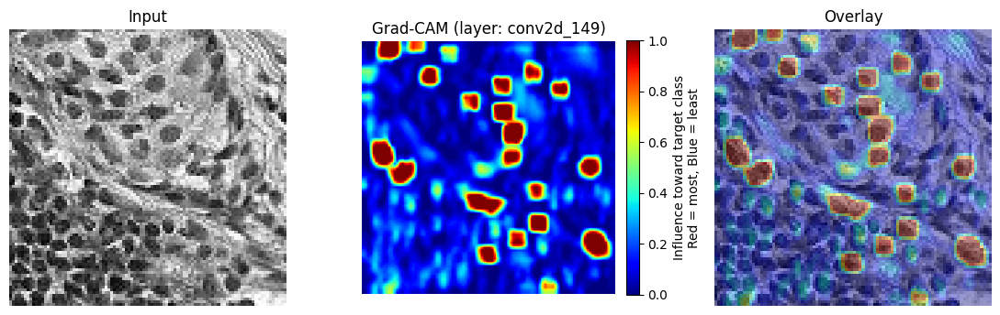

Processing image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
1/1 [==============================] - 0s 23ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.3060


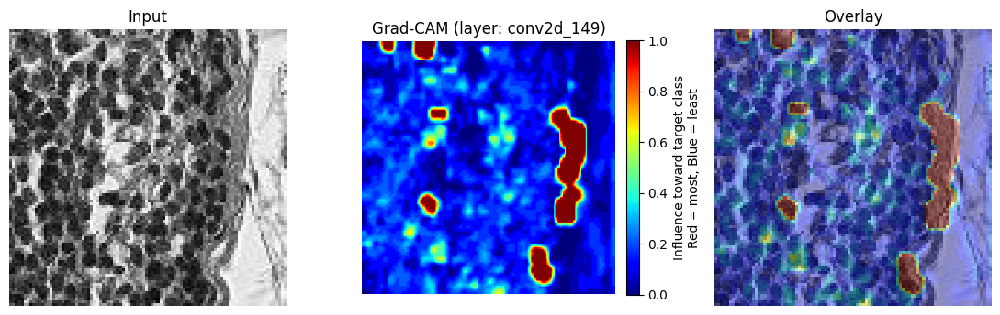

Processing image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
1/1 [==============================] - 0s 18ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.1823


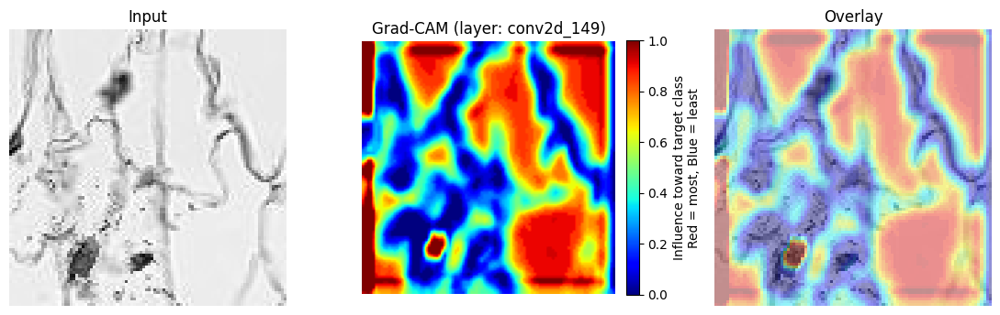

Processing image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
1/1 [==============================] - 0s 21ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.7422


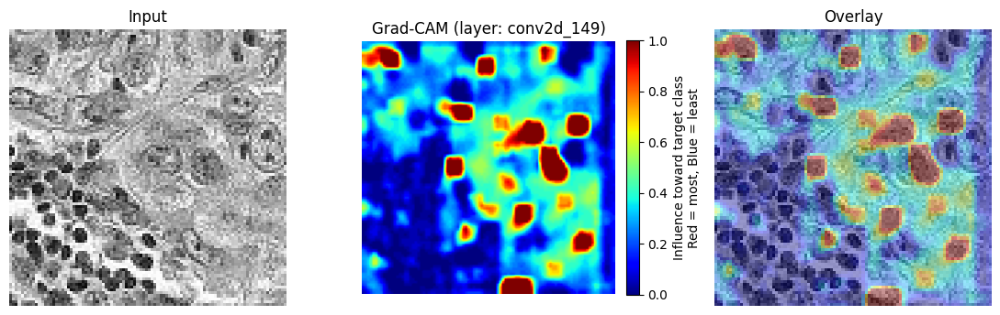

Processing image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
1/1 [==============================] - 0s 21ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0938


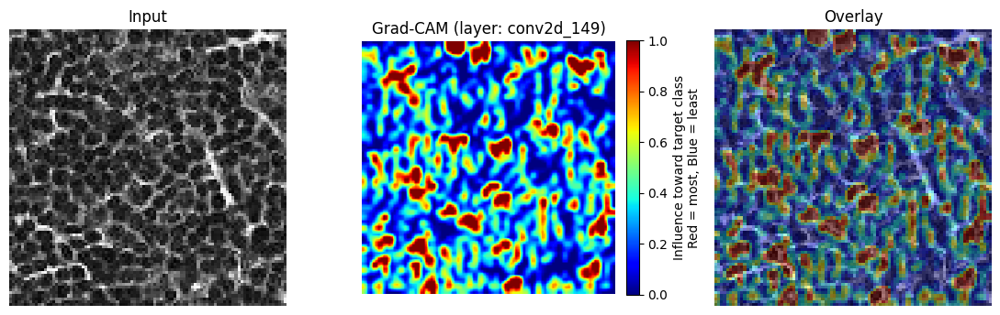

Processing image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
1/1 [==============================] - 0s 20ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.8582


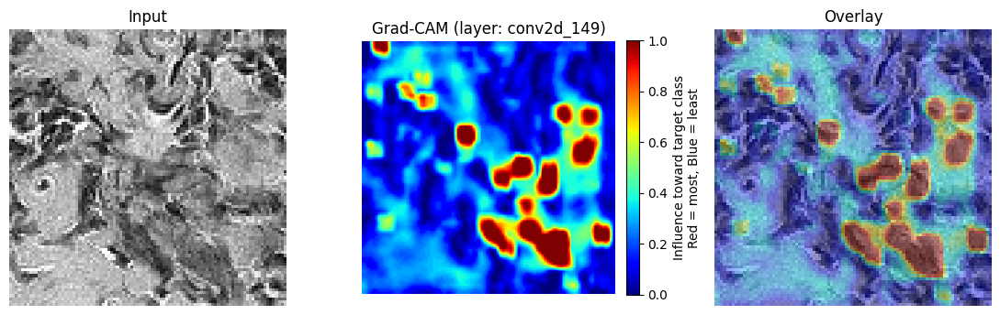

Processing image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
1/1 [==============================] - 0s 20ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.2269


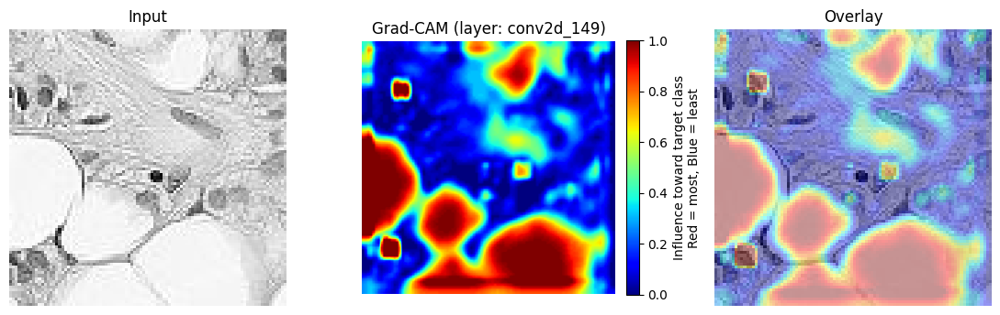

In [123]:
plot_heat_maps(
    model_gray_removed_conv2d_layers,
    x_train_norm_gray,
    y_train,
    train_image_files,
    file_indices=file_indices,
)

#### Remove Dense 64 layer from classification head

I removed the dense layer with 64 neurons from the classification head. I wanted to see if the model's performance would improve by removing the additional complexity in the classification head instead of the CNN architecture. The validation accuracy was about 0.86, which is similar to the baseline model. The training and validation losses started to diverge, indicating that without early stopping, the model would overfit on the training dataset. 

The Kaggle submission for this model was 0.7932 and 0.8100 for the public and private leaderboards, respectively. This is worse than the baseline model, but I believe it's due to the model not having enough complexity in the classification head to learn the necessary features for the classification task.

In [124]:
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    ReLU,
    GlobalAveragePooling2D,
    Dense,
    Dropout,
)

model_gray_removed_dense_64 = Sequential(
    [
        Conv2D(32, 3, padding="same", input_shape=(96, 96, 1), activation="relu"),
        BatchNormalization(),
        Conv2D(32, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(64, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(128, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(128, 3, padding="same", activation="relu"),
        MaxPooling2D(2), 
        GlobalAveragePooling2D(),
        Dropout(0.5),
        # Dense(64, activation="relu"), # Removed to reduce complexity
        Dense(1, activation="sigmoid", dtype="float32"),  # Output layer for binary classification
    ]
)
# model_gray_baseline
model_gray_removed_dense_64.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"],
)
model_name = get_model_name(model_gray_removed_dense_64) + "_grayscale_gap"
model_name = "model_gray_removed_dense_64_" + model_name
print(f"Model Name: {model_name}")
print("Model Summary:")
model_gray_removed_dense_64.summary()

Model Name: model_gray_removed_dense_64_CNN_96x96x1_C32-32-64-64-128-128_FC1_sigmoid_287K_adam_grayscale_gap
Model Summary:
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_150 (Conv2D)         (None, 96, 96, 32)        320       
                                                                 
 batch_normalization_90 (Ba  (None, 96, 96, 32)        128       
 tchNormalization)                                               
                                                                 
 conv2d_151 (Conv2D)         (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d_70 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_152 (Conv2D)         (None, 48, 48, 64)        18496 

In [125]:
history = model_gray_removed_dense_64.fit(
    X_train_subset_gray,
    y_train_gray_subset,
    validation_data=(X_val_gray, y_gray_val),
    epochs=30,
    batch_size=32,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    ],
)

Epoch 1/30
563/563 [==============================] - 14s 20ms/step - loss: 0.5073 - accuracy: 0.7758 - val_loss: 0.6729 - val_accuracy: 0.6535
Epoch 2/30
563/563 [==============================] - 11s 19ms/step - loss: 0.4272 - accuracy: 0.8134 - val_loss: 0.5186 - val_accuracy: 0.7880
Epoch 3/30
563/563 [==============================] - 13s 23ms/step - loss: 0.3903 - accuracy: 0.8349 - val_loss: 1.1556 - val_accuracy: 0.6265
Epoch 4/30
563/563 [==============================] - 13s 22ms/step - loss: 0.3603 - accuracy: 0.8484 - val_loss: 0.3824 - val_accuracy: 0.8485
Epoch 5/30
563/563 [==============================] - 13s 22ms/step - loss: 0.3308 - accuracy: 0.8641 - val_loss: 0.4997 - val_accuracy: 0.7690
Epoch 6/30
563/563 [==============================] - 12s 22ms/step - loss: 0.3118 - accuracy: 0.8707 - val_loss: 0.8316 - val_accuracy: 0.6600
Epoch 7/30
563/563 [==============================] - 12s 21ms/step - loss: 0.2965 - accuracy: 0.8776 - val_loss: 0.3582 - val_accuracy:

Model Name: model_gray_removed_dense_64_CNN_96x96x1_C32-32-64-64-128-128_FC1_sigmoid_287K_adam_grayscale_gap
Model and history saved as model_gray_removed_dense_64_CNN_96x96x1_C32-32-64-64-128-128_FC1_sigmoid_287K_adam_grayscale_gap.


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


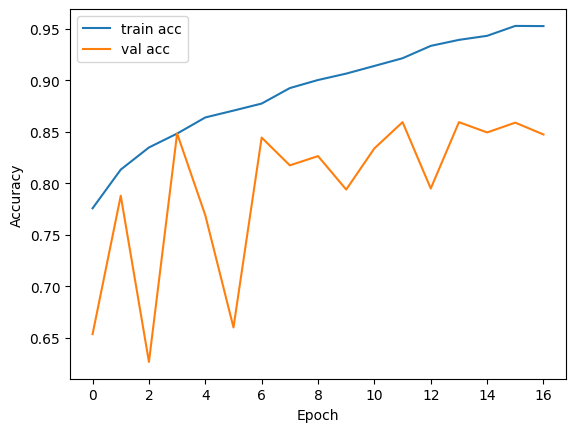

In [126]:
print(f"Model Name: {model_name}")
save_model_and_history(
    model_gray_removed_dense_64,
    history,
    model_name=model_name,
    model_dir=MODEL_DIR,
)
plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Processing image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
1/1 [==============================] - 0s 133ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0107


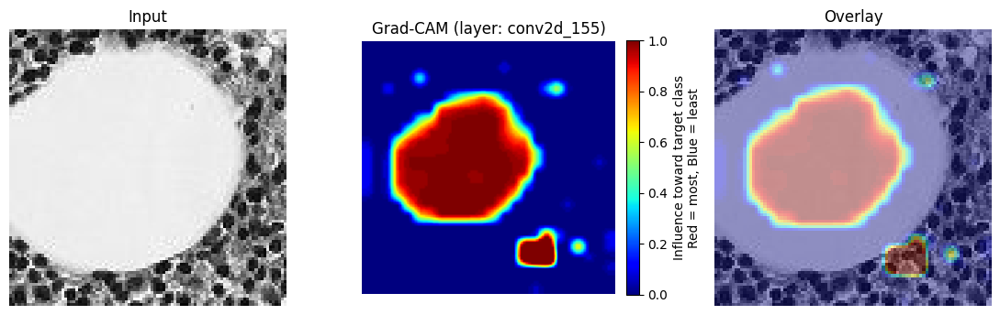

Processing image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
1/1 [==============================] - 0s 28ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9213


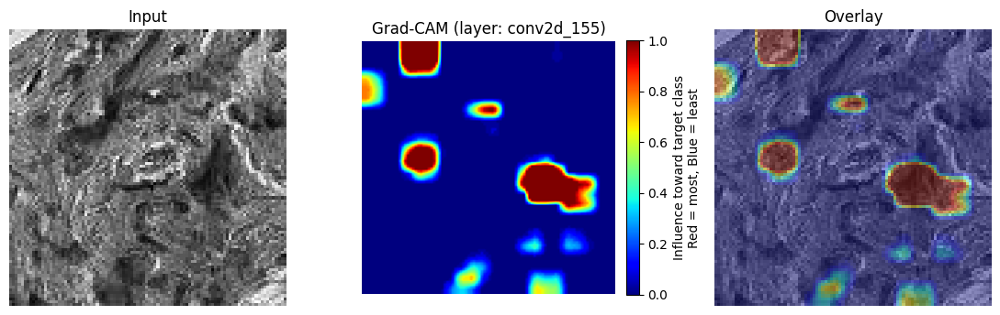

Processing image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.8802


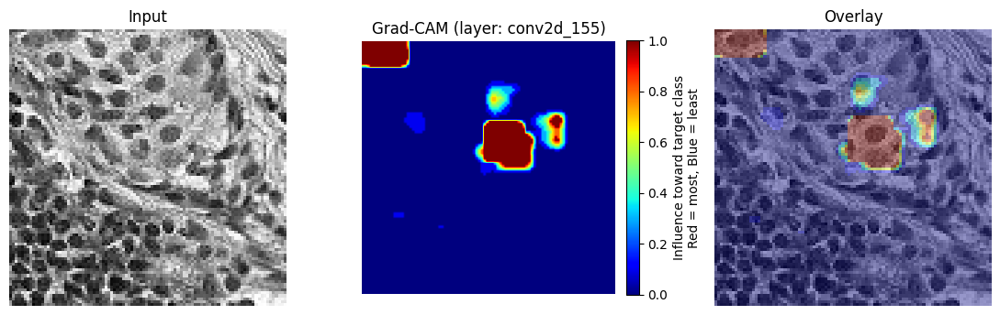

Processing image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
1/1 [==============================] - 0s 26ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0766


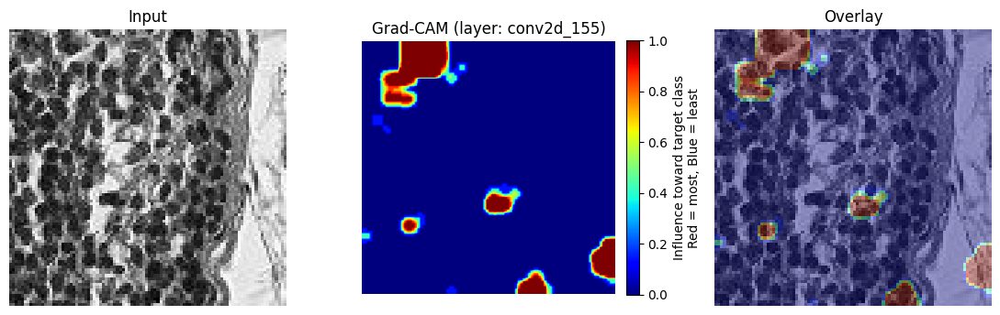

Processing image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
1/1 [==============================] - 0s 26ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0096


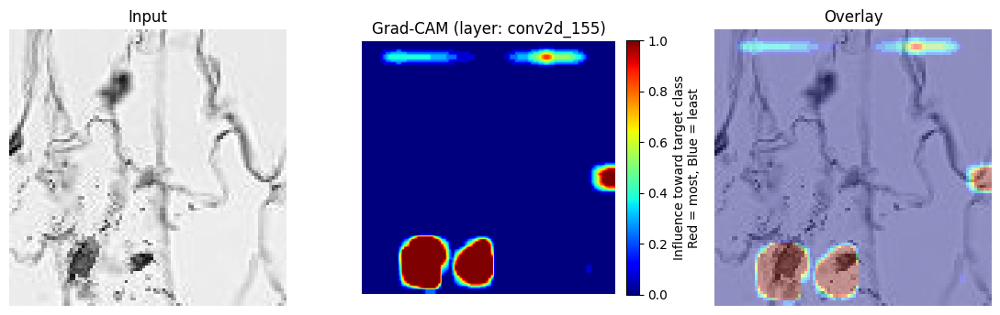

Processing image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
1/1 [==============================] - 0s 24ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9974


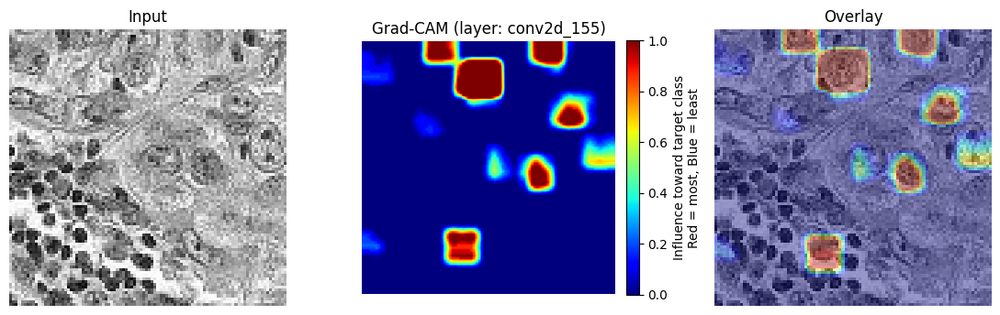

Processing image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
1/1 [==============================] - 0s 29ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0092


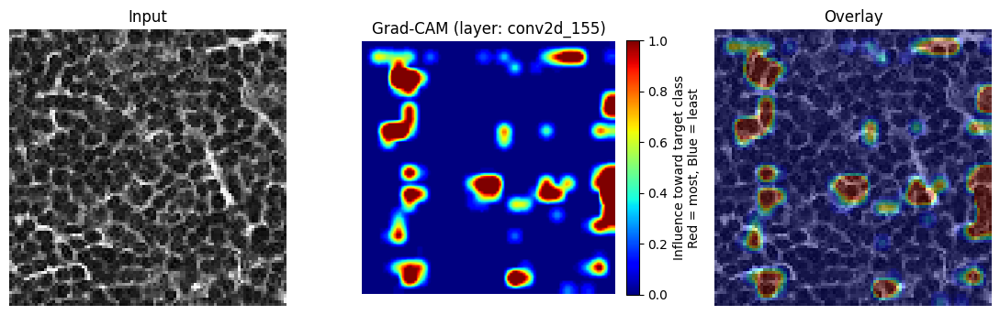

Processing image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.3851


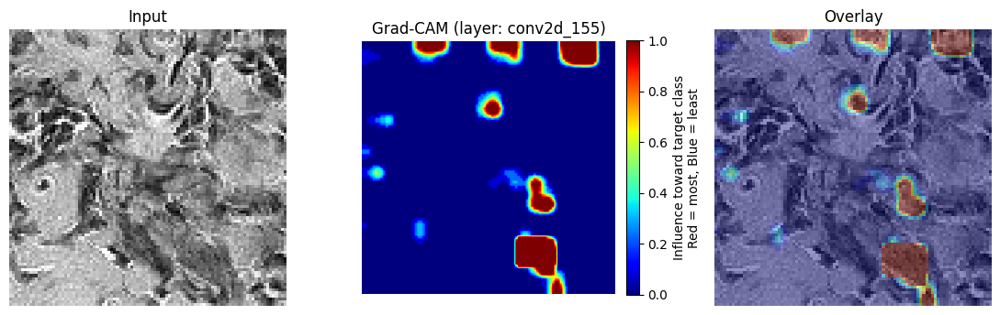

Processing image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
1/1 [==============================] - 0s 31ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.6015


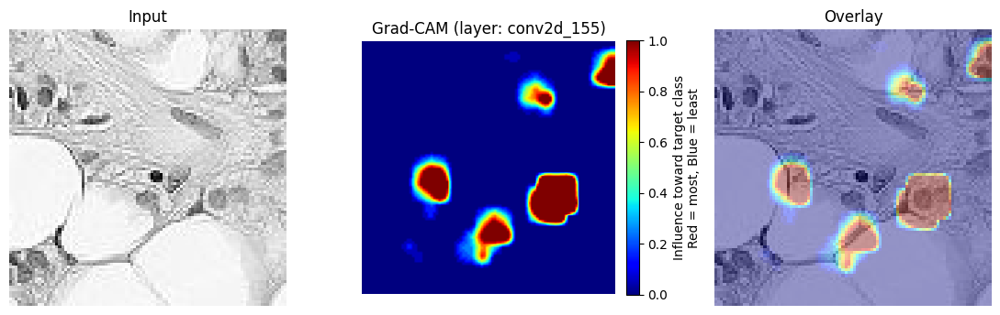

In [127]:
plot_heat_maps(
    model_gray_removed_dense_64,
    x_train_norm_gray,
    y_train,
    train_image_files,
    file_indices=file_indices,
)

#### Decrease the Dropout rate to 0.3

I decreased the dropout rate from 0.5 to 0.3. I wanted to see if the model's performance would improve by reducing the amount of dropout in the model. The validation accuracy was about 0.86, which is similar to the baseline model. It's worth noting that the training and validation losses didn't diverge as much as the previous models, indicating that the model is not overfitting on the training dataset.

The Kaggle submission for this model was 0.8378 and 0.8411 for the public and private leaderboards, respectively. This essentially is the same as the baseline model.




In [25]:
model_name = "model_gray_reduced_dropout_from_05_to_03_CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale_gap"
model = load_model(MODEL_DIR + model_name + ".h5")
model_df = get_test_predictions(
    model,
    test_image_files,
    test_dir=TEST_DIR,
    target_size=(96, 96),
    batch_size=len(test_image_files),
    gray_scale=True,
    dtype=np.float16,
)
# to csv
model_df.to_csv((SUB_DIR + model_name + "_predictions.csv"), index=False)

Loading 57458 images from /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Week 3/data/test/...
Processed 10000 images out of 57458...
Current memory usage: 9917.69 MB
Percent Completed: 17.40%
Expected memory usage: 1.08 MB
Processed 20000 images out of 57458...
Current memory usage: 9917.69 MB
Percent Completed: 34.81%
Expected memory usage: 0.54 MB
Processed 30000 images out of 57458...
Current memory usage: 9920.31 MB
Percent Completed: 52.21%
Expected memory usage: 5.39 MB
Processed 40000 images out of 57458...
Current memory usage: 9922.94 MB
Percent Completed: 69.62%
Expected memory usage: 7.81 MB
Processed 50000 images out of 57458...
Current memory usage: 9925.94 MB
Percent Completed: 87.02%
Expected memory usage: 9.70 MB
898/898 [==============================] - 10s 10ms/step


In [128]:
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    ReLU,
    GlobalAveragePooling2D,
    Dense,
    Dropout,
)

model_gray_reduced_dropout_from_05_to_03 = Sequential(
    [
        Conv2D(32, 3, padding="same", input_shape=(96, 96, 1), activation="relu"),
        BatchNormalization(),
        Conv2D(32, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(64, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, 3, padding="same", activation="relu"),
        MaxPooling2D(2),
        Conv2D(128, 3, padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(128, 3, padding="same", activation="relu"),  
		MaxPooling2D(2),
        GlobalAveragePooling2D(),
        Dropout(0.3), # 
        Dense(64, activation="relu"),
        Dense(1, activation="sigmoid", dtype="float32"),  # Output layer for binary classification
    ]
)
# model_gray_baseline
model_gray_reduced_dropout_from_05_to_03.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"],
)
model_name = get_model_name(model_gray_reduced_dropout_from_05_to_03) + "_grayscale_gap"
model_name = "model_gray_reduced_dropout_from_05_to_03_" + model_name
print(f"Model Name: {model_name}")
print("Model Summary:")
model_gray_reduced_dropout_from_05_to_03.summary()


Model Name: model_gray_reduced_dropout_from_05_to_03_CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale_gap
Model Summary:
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_156 (Conv2D)         (None, 96, 96, 32)        320       
                                                                 
 batch_normalization_93 (Ba  (None, 96, 96, 32)        128       
 tchNormalization)                                               
                                                                 
 conv2d_157 (Conv2D)         (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d_73 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_158 (Conv2D)         (None, 48, 48, 

In [129]:
history = model_gray_reduced_dropout_from_05_to_03.fit(
    X_train_subset_gray,
    y_train_gray_subset,
    validation_data=(X_val_gray, y_gray_val),
    epochs=30,
    batch_size=32,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    ],
)

Epoch 1/30
563/563 [==============================] - 14s 21ms/step - loss: 0.4786 - accuracy: 0.7821 - val_loss: 1.2981 - val_accuracy: 0.5415
Epoch 2/30
563/563 [==============================] - 12s 20ms/step - loss: 0.4192 - accuracy: 0.8168 - val_loss: 0.6722 - val_accuracy: 0.6810
Epoch 3/30
563/563 [==============================] - 12s 21ms/step - loss: 0.3740 - accuracy: 0.8373 - val_loss: 0.5887 - val_accuracy: 0.6945
Epoch 4/30
563/563 [==============================] - 11s 20ms/step - loss: 0.3398 - accuracy: 0.8556 - val_loss: 0.3562 - val_accuracy: 0.8460
Epoch 5/30
563/563 [==============================] - 11s 20ms/step - loss: 0.3114 - accuracy: 0.8684 - val_loss: 0.5470 - val_accuracy: 0.7625
Epoch 6/30
563/563 [==============================] - 11s 20ms/step - loss: 0.2907 - accuracy: 0.8807 - val_loss: 0.3258 - val_accuracy: 0.8585
Epoch 7/30
563/563 [==============================] - 11s 20ms/step - loss: 0.2585 - accuracy: 0.8959 - val_loss: 0.5476 - val_accuracy:

Model Name: model_gray_reduced_dropout_from_05_to_03_CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale_gap
Model and history saved as model_gray_reduced_dropout_from_05_to_03_CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale_gap.


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


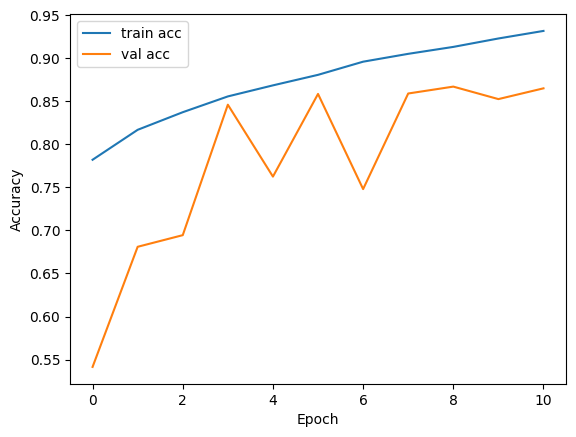

In [130]:
print(f"Model Name: {model_name}")
save_model_and_history(
    model_gray_reduced_dropout_from_05_to_03,
    history,
    model_name=model_name,
    model_dir=MODEL_DIR,
)
plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Processing image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
1/1 [==============================] - 0s 139ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.2570


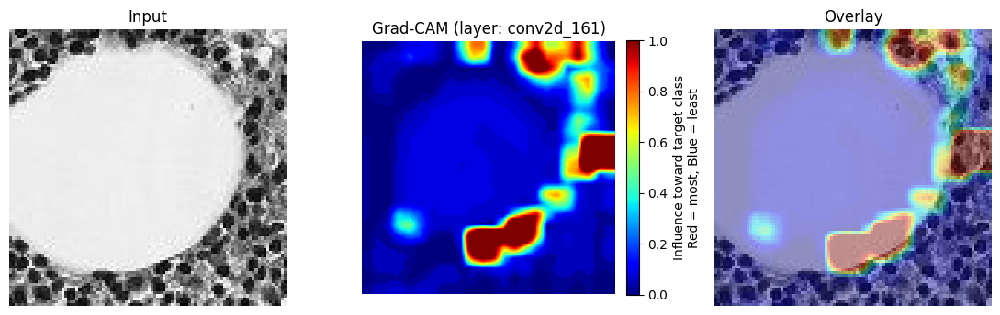

Processing image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9239


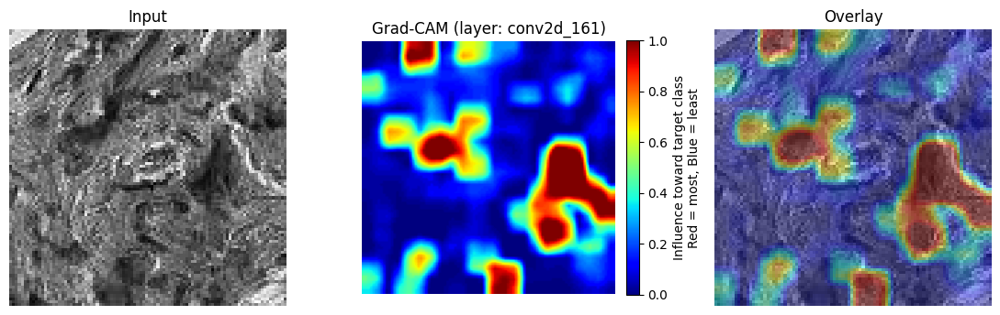

Processing image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
1/1 [==============================] - 0s 26ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.5549


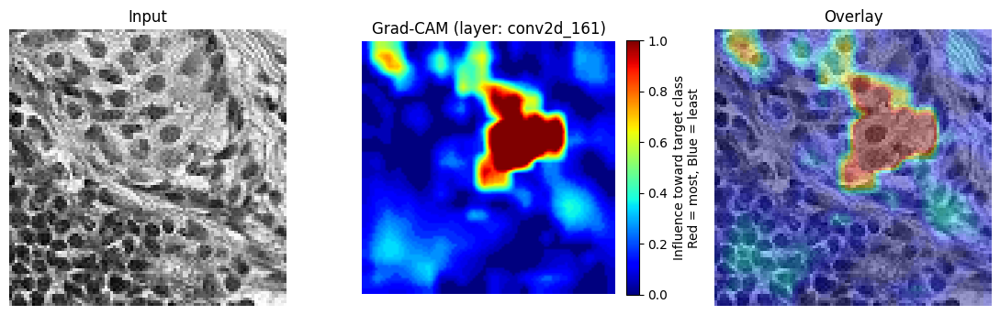

Processing image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.4034


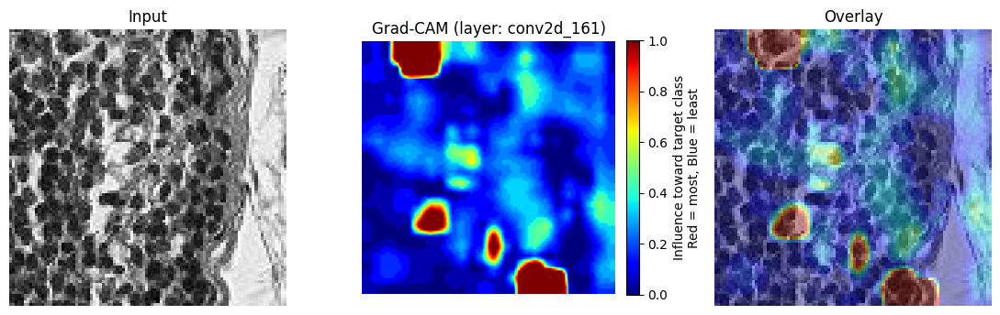

Processing image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0829


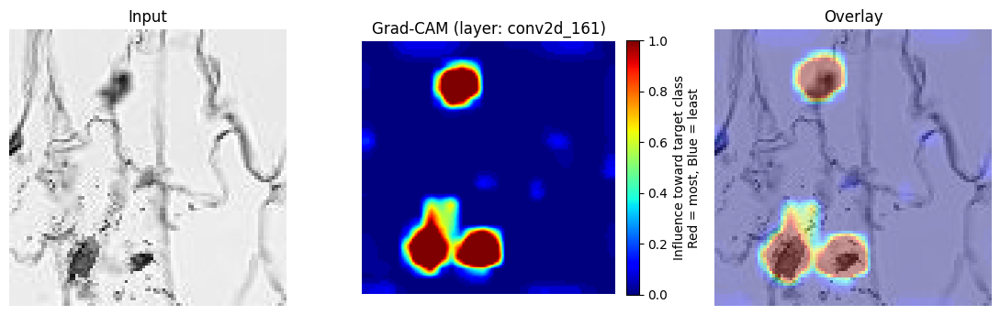

Processing image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
1/1 [==============================] - 0s 25ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9229


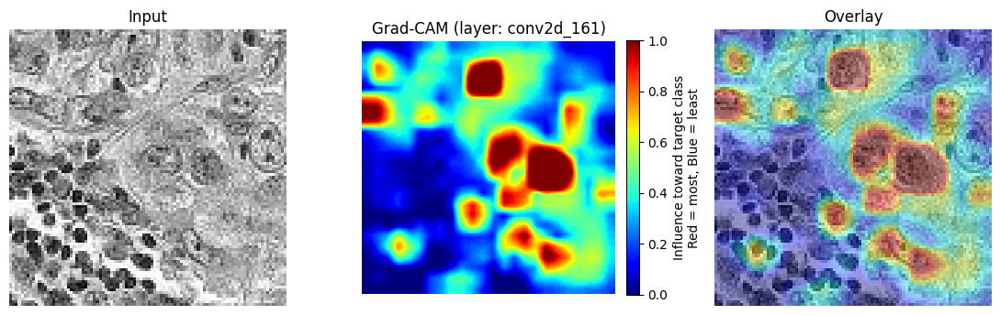

Processing image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
1/1 [==============================] - 0s 28ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0142


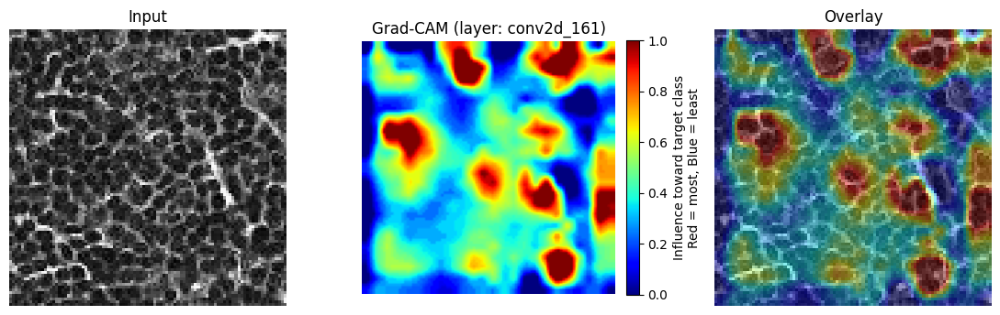

Processing image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9545


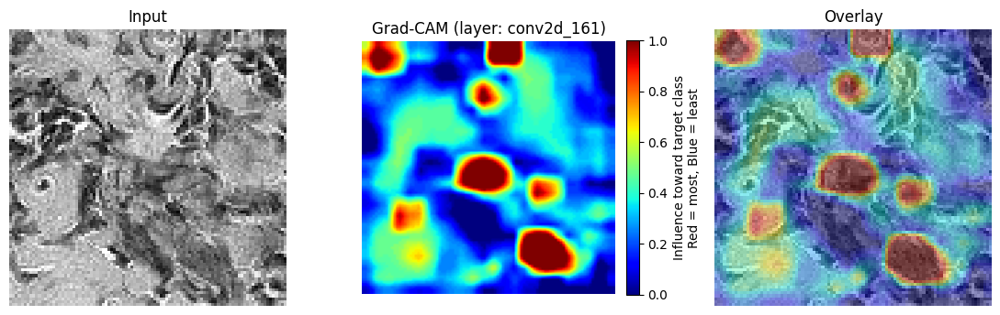

Processing image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
1/1 [==============================] - 0s 23ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9409


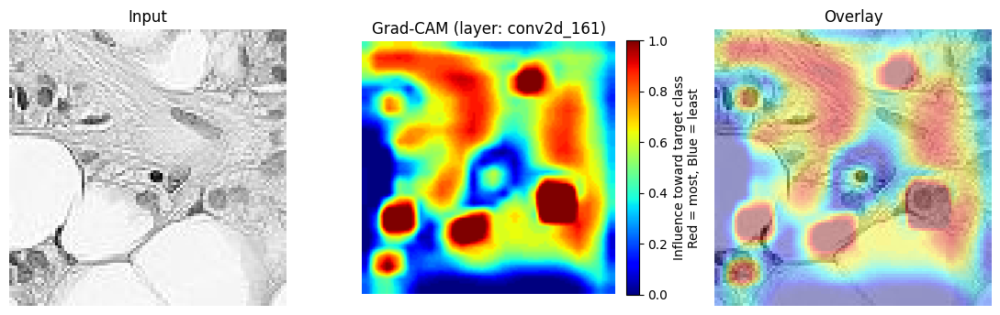

In [131]:
plot_heat_maps(
    model_gray_reduced_dropout_from_05_to_03,
    x_train_norm_gray,
    y_train,
    train_image_files,
    file_indices=file_indices,
)

# Final Model Predictions

Since the baseline model was the best performing model, I will train it on the entire training dataset with the grayscale images and submit the predictions to Kaggle for evaluation. The final results from Kaggle were 0.8423 and 0.8636 for the public and private leaderboards, respectively. This is an improvement over the baseline model's performance on the test dataset; however, not as significant as I had hoped considering the amount of time spent on training compared to the first attempt.

In [5]:

# import batch normalization
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    ReLU,
    GlobalAveragePooling2D,
    Dense,
    Dropout,
)

model_gray = Sequential(
    [
        # Convolutional layers for image feature extraction
        Conv2D(32, (3, 3), padding="same", activation="relu", input_shape=(96, 96, 1)),
        BatchNormalization(),
        Conv2D(32, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(128, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        # Classification layers
        GlobalAveragePooling2D(),
        Dropout(0.5),
        Dense(64, activation="relu"),
        Dense(1, activation="sigmoid", dtype="float32"),
    ]
)
model_gray.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
model_name = get_model_name(model_gray) + "_grayscale_gap_fully_trained"
print(f"Model Name: {model_name}")
print("Model Summary:")
model_gray.summary()

2025-08-17 17:54:06.254535: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-17 17:54:06.254611: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-17 17:54:06.254627: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-17 17:54:06.459131: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-08-17 17:54:06.459194: I external/local_xla/xla/stream_executor

Model Name: CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale_gap_fully_trained
Model Summary:
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 96, 96, 32)        320       
                                                                 
 batch_normalization (Batch  (None, 96, 96, 32)        128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 48, 48, 32)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 48, 48, 64)        18496     
        

In [ ]:
# Load entire dataset for training
x_train_norm_gray, y_train_gray = load_train_images(
    train_image_files,
    TRAIN_DIR,
    labels_df=y_df,  # y_train_df if available, otherwise None for test set
    target_size=(96, 96),
    start_index=0,
    batch_size=len(train_image_files),  # Load all images at once
    gray_scale=True,
    dtype=np.float16,  # np.float32 or np.float16
)
# train test split
X_train_gray_split, X_val_gray, y_train_gray_split, y_val_gray = train_test_split(
    x_train_norm_gray, y_train_gray, test_size=0.1, random_state=42
)
# after the split
del x_train_norm_gray
import gc

gc.collect()

In [10]:
AUTOTUNE = tf.data.AUTOTUNE
BS = 16

train_ds = (tf.data.Dataset
            .from_tensor_slices((X_train_gray_split, y_train_gray_split.astype('uint8')))
            .shuffle(8192)            # lower if RAM tight (e.g., 2048)
            .batch(BS)
            .prefetch(AUTOTUNE))

val_ds = (tf.data.Dataset
          .from_tensor_slices((X_val_gray, y_val_gray.astype('uint8')))
          .batch(BS)
          .prefetch(AUTOTUNE))

history = model_gray.fit(
    train_ds,
    epochs=30,
    validation_data=val_ds,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
    workers=1, use_multiprocessing=False,
)

Epoch 1/30


2025-08-17 17:59:25.091969: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-08-17 17:59:25.521770: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2025-08-17 17:59:26.674372: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2025-08-17 17:59:27.587813: I external/local_xla/xla/service/service.cc:168] XLA service 0x75509ed6b190 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-08-17 17:59:27.587859: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3080 Ti Laptop GPU, Compute Capability 8.6
2025-08-17 17:59:27.620960: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1755467967.753026   19190 de

12377/12377 [==============================] - 190s 15ms/step - loss: 0.3712 - accuracy: 0.8397 - val_loss: 0.2811 - val_accuracy: 0.8850
Epoch 2/30
12377/12377 [==============================] - 190s 15ms/step - loss: 0.2611 - accuracy: 0.8946 - val_loss: 0.3050 - val_accuracy: 0.8767
Epoch 3/30
12377/12377 [==============================] - 189s 15ms/step - loss: 0.2248 - accuracy: 0.9120 - val_loss: 0.2322 - val_accuracy: 0.9071
Epoch 4/30
12377/12377 [==============================] - 169s 14ms/step - loss: 0.2044 - accuracy: 0.9218 - val_loss: 0.2276 - val_accuracy: 0.9063
Epoch 5/30
12377/12377 [==============================] - 182s 15ms/step - loss: 0.1870 - accuracy: 0.9285 - val_loss: 0.2086 - val_accuracy: 0.9177
Epoch 6/30
12377/12377 [==============================] - 192s 15ms/step - loss: 0.1708 - accuracy: 0.9352 - val_loss: 0.1782 - val_accuracy: 0.9335
Epoch 7/30
12377/12377 [==============================] - 192s 16ms/step - loss: 0.1582 - accuracy: 0.9407 - val_loss

In [11]:
# Save the model
model_name = get_model_name(model_gray) + "_grayscale_gap_fully_trained"
print(f"Model Name: {model_name}")
save_model_and_history(
    model_gray,
    history,
    model_name=model_name,
    model_dir=MODEL_DIR,
)

Model Name: CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale_gap_fully_trained
Model and history saved as CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale_gap_fully_trained.


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


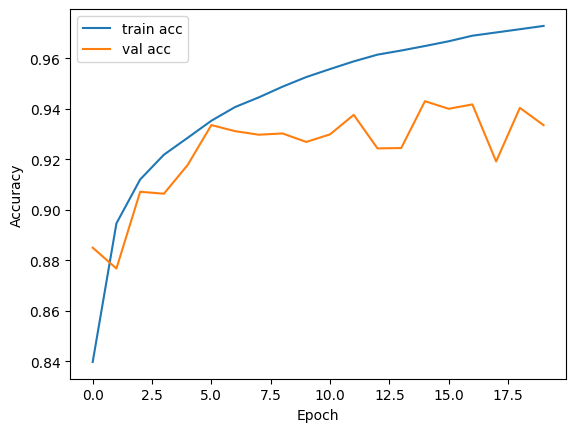

In [12]:
# plot training history
plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

File indices for examples: [1288, 5217, 8269, 8427, 11057, 14898, 15985, 16862, 17980]
Processing image at index: 1288
Image Name: d450b11347e15d53490206b7d8dc44207b0e5326.tif
1/1 [==============================] - 0s 433ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0014


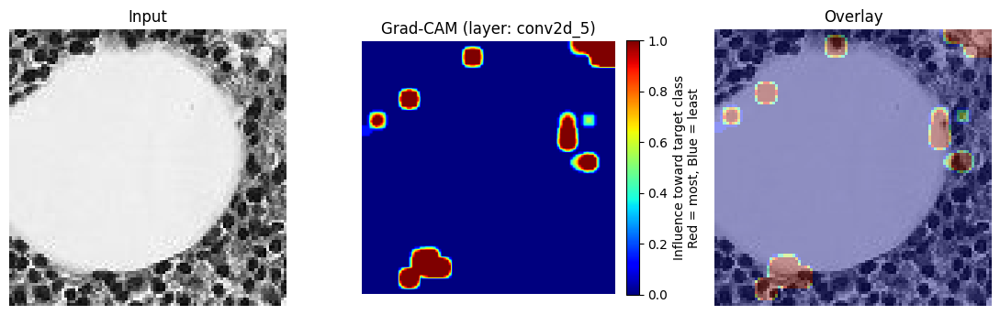

Processing image at index: 5217
Image Name: 8918830b9466236be012c57ead765be063a0005b.tif
1/1 [==============================] - 0s 19ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9791


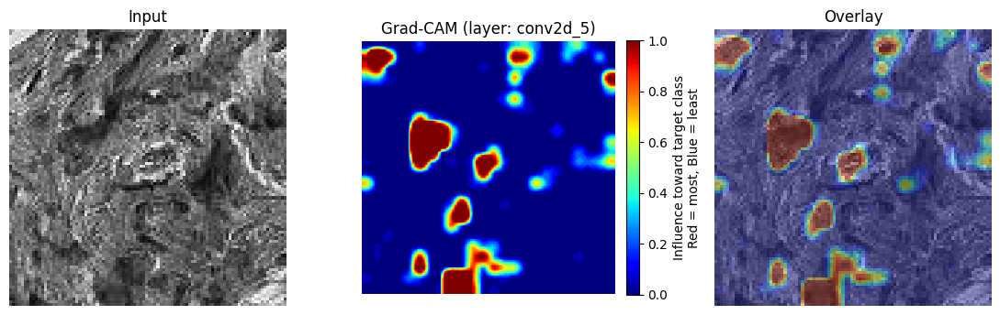

Processing image at index: 8269
Image Name: 8eabc80fce3a231915b93651f5e9238447d3db62.tif
1/1 [==============================] - 0s 22ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9958


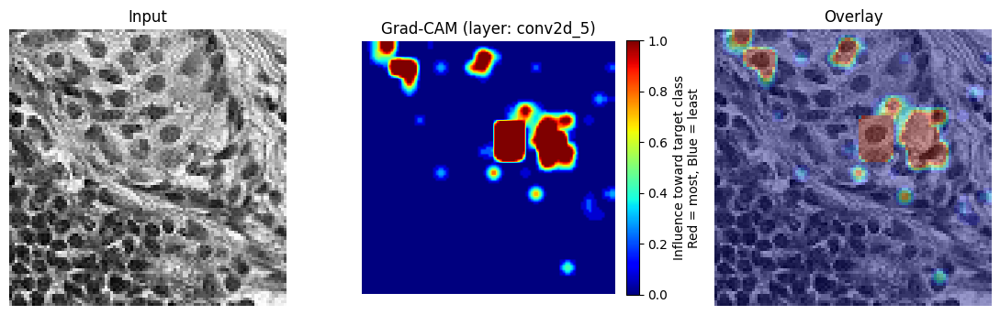

Processing image at index: 8427
Image Name: 8549665b7d0a808ab920e9dbed44bcf996d3019a.tif
1/1 [==============================] - 0s 21ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0000


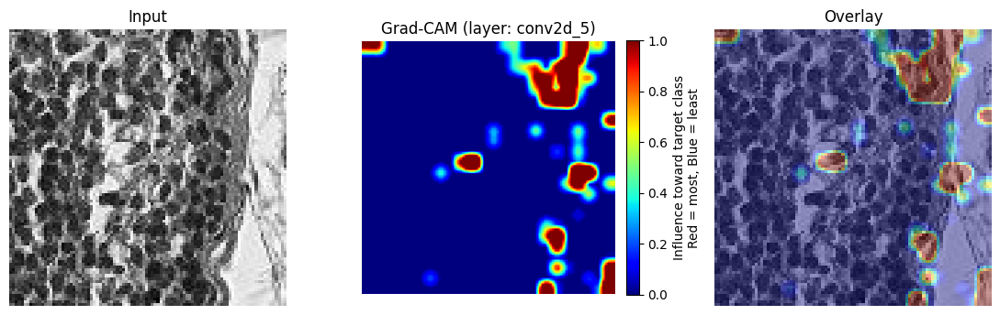

Processing image at index: 11057
Image Name: 6db1b2e1fed0431041c02337dd25575787d08acf.tif
1/1 [==============================] - 0s 20ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0030


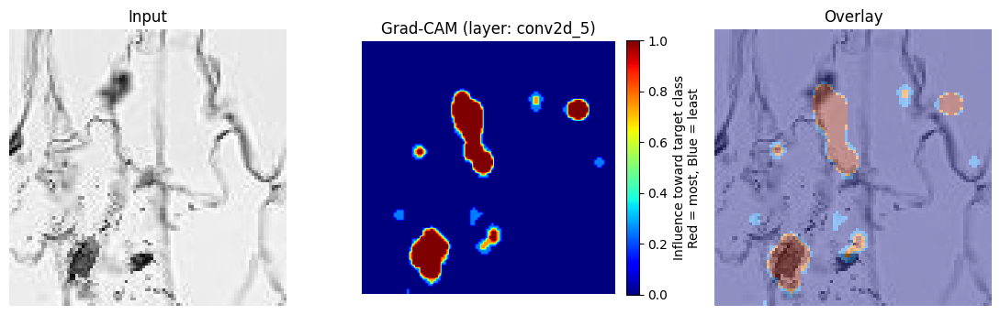

Processing image at index: 14898
Image Name: efc515748e4faac32ed2b703c6ed4961330a0c8f.tif
1/1 [==============================] - 0s 21ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 1.0000


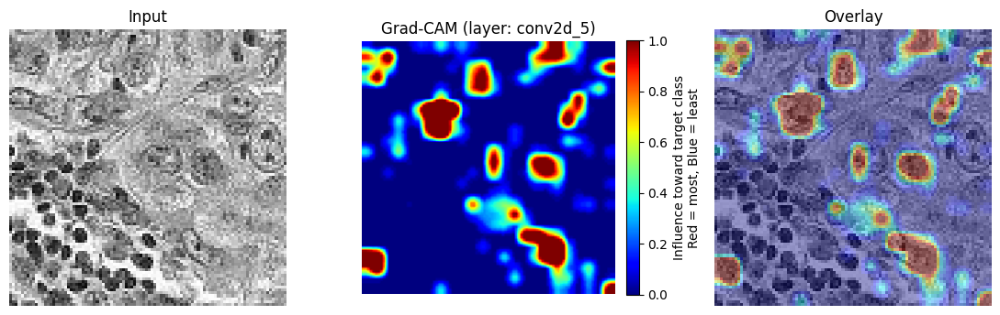

Processing image at index: 15985
Image Name: 39f2e52674cf710d6a3616ac34b62d161bff143d.tif
1/1 [==============================] - 0s 19ms/step
Actual Class: 0
Predicted Class: 0
Predicted Probability: 0.0061


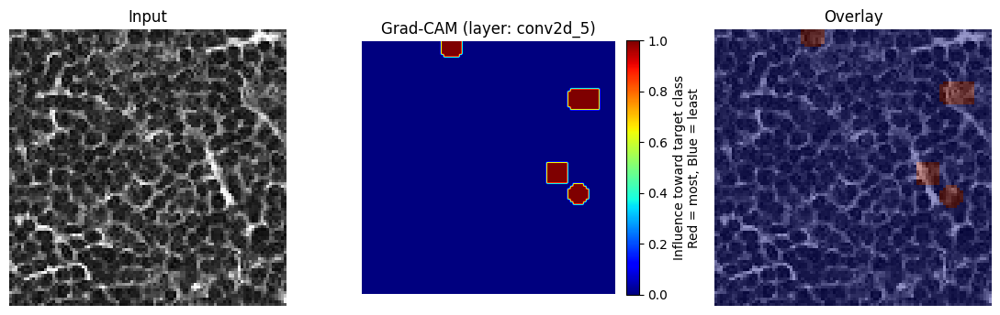

Processing image at index: 16862
Image Name: d28c568002156f378a54ba13504b5fa5d2505754.tif
1/1 [==============================] - 0s 27ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9068


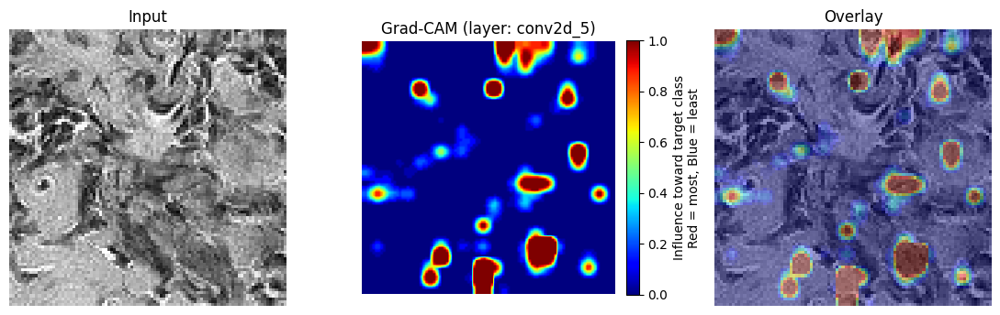

Processing image at index: 17980
Image Name: 9fbe25c7ffa15214006e417d8a3c3a78a5f8387a.tif
1/1 [==============================] - 0s 16ms/step
Actual Class: 0
Predicted Class: 1
Predicted Probability: 0.9983


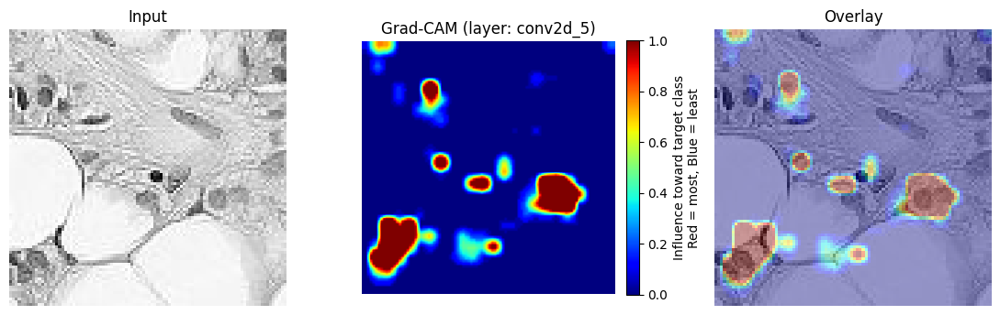

In [15]:
print("File indices for examples:", file_indices)
# Plot feature map
plot_heat_maps(
    model_gray,
    X_subset_gray,
    y_subset_gray,
    train_image_files,
    file_indices=file_indices,
)

In [ ]:
# Predict on test set
model_name = "CNN_96x96x1_C32-32-64-64-128-128_FC64-1-GAP_relu_295K_adam_grayscale_gap_fully_trained"
model_gray = load_model(MODEL_DIR + model_name + ".h5")
baseline_df = get_test_predictions(
    model_gray,
    test_image_files,
    test_dir=TEST_DIR,
    target_size=(96, 96),
    batch_size=len(test_image_files),
    gray_scale=True,
    dtype=np.float16,
)
baseline_df.to_csv((SUB_DIR + "baseline_predictions_grayscale_fully_trained.csv"), index=False)


# Results Summary and Conclusion

I made many different architecture changes in the hyperparameter tuning process. These changes were negligible in terms of the performance and accuracy of the model. All these models were trained on a 20,000 image subset of the training dataset. It wasn't until I was able to configure my memory and GPU to train on the entire training dataset that I was able to achieve significant improvements in the model's performance. This leads me to believe that more data is the key to improving the model's performance. To get more data, there are some options that can be explored in the future, like mirroring the dataset. 

In addition to getting the accuracy models, I spent significant time in attempting to create a model that was explainable. This was achieved through using Grad-CAM techniques to visualize what portions of the images were most important for the classification task. I found that this was useful when attempting to troubleshoot the model. Instead of just brute forcing with a bunch of different hyperparameters with a method like grid search, I was able to have targeted improvements to the architecture based on my interpretations of the heatmaps. This could be improved if I had more domain knowledge and experience, but I think my attempt at this model was a very good first step.

Some future work could be done that would augment the dataset to create more diverse training images and examples. Additionally, using the color images would also improve the model's performance, but as I was struggling with memory issues with the grayscale images, I decided to focus on the grayscale images for the hyperparameter tuning process.

Since I was focusing on the architecture, I didn't do much hyperparameter tuning on the optimizer. I used the Adam optimizer with a learning rate of 0.001, which is a good baseline for most CNN architectures. However, I could explore other optimizers and scheduled learning rates to see if the model's performance could be improved further. It's possible that my model's would benefit from a more complex optimizer that would reduce the probability of falling into a local minimum during the training process, but I thought I would get more improvements on the architecture changes first.

In real-world applications, the balance of the dataset is most likely going to be skewed towards non-cancerous images; thus, additional metrics such as precision, recall, and f1 score would be more appropriate. However, in this project, I focused on the accuracy of the model, as the Kaggle competition is based on accuracy.

It's also critical to understand the need for domain knowledge and experience in the medical field when developing models for medical diagnoses. The model's performance is only as good as the data it is trained on, and without domain knowledge, it's difficult to interpret the results and ensure that the model is making accurate predictions. This could lead to significant type I or type II errors in the classification task, which could have serious consequences for the patients. Type I errors (false positives) could lead to erroneous tests and treatments that could come with their own risks and side effects. Type II errors (false negatives) could lead to a lack of treatment and a significant delay in treatment time; thus, significantly decreasing the chances of a positive outcome for the patient.

Medical models should be developed with an understanding of the ethical implications of the model's predictions. Regardless of a single metrics representation of the model, it's important to ensure sufficent review and oversight of the model's applications in the real world.

In conclusion, this project was a good first attempt at developing a model that is capable of classifying cancerous images at an accuracy of about 0.85. The model was able to be trained and tuned on a laptop with limited resources in a timely manner. The model is also capable of being explainable and interpretable through the use of Grad-CAM techniques. However, there is still room for improvement in the model's performance, and future work could be investigated to improve the model's performance and generalizability, along with looking at additional metrics to ensure alignment with the medical domain's needs. 

Below is the summary of the project and the final model's performance on the test dataset:
| Model Description | Validation Accuracy | Public Kaggle Accuracy | Private Kaggle Accuracy |
|-------------------|---------------------|--------------------|---------------------|
| Grayscale Model Baseline| ~0.85 | 0.8382 | 0.8503 |
|Increase last layer kernel size from 3 to 5 in the last convolutional layer | ~0.85 | 0.8149 | 0.8397 |
| Additional CNN layers | ~0.86|0.8106|0.8207|
|Remove Convolutional layer with 64 fiters |~0.77|0.8082|0.8211|
|Remove Dense layer with 64 neurons |~0.85|0.7932|0.8100|
| Dropout to 0.3 from 0.5 |~0.86|0.8378|0.8411|
| Grayscale Model Entire Dataset | ~0.93 | 0.8423 | 0.8636 |


# References

[1] “Histopathologic Cancer Detection,” @kaggle, 2025. https://www.kaggle.com/competitions/histopathologic-cancer-detection (accessed Aug. 14, 2025).

[2] D.-K. Kim, “Grad-CAM: A Gradient-based Approach to Explainability in Deep Learning,” Medium, Feb. 17, 2025. https://medium.com/@kdk199604/grad-cam-a-gradient-based-approach-to-explainability-in-deep-learning-871b3ab8a6ce (accessed Aug. 17, 2025).
‌
‌